In [1]:
import glob
import astropy
import importlib
import math
import numpy as np
import xlwt
import xlsxwriter
import warnings
warnings.filterwarnings('ignore')

from xlwt import Workbook
from reduct_funcs import funcs_calib_and_plot
from reduct_funcs import funcs_star_finder
from reduct_funcs import funcs_apt_phot
from reduct_funcs import funcs_utils
from reduct_funcs import funcs_polarimetry

importlib.reload(funcs_calib_and_plot)
importlib.reload(funcs_star_finder)
importlib.reload(funcs_apt_phot)
importlib.reload(funcs_utils)
importlib.reload(funcs_polarimetry)

<module 'reduct_funcs.funcs_polarimetry' from 'C:\\Users\\afiq-Astro\\Desktop\\TSSP\\reductions_3\\reduct_funcs\\funcs_polarimetry.py'>

In [2]:
#fp = 'C:/Users/afiq-Astro/Desktop/TSSP/reductions_3/files_sorted/2020-04-05/'
#funcs_utils.make_dir(fp )

In [3]:
MJD = '2020-03-26'
#Its good to start to look in these directories first to update you with what looks like what

bias = glob.glob('./files_sorted/'+MJD+'/bias/*')
dark = glob.glob('./files_sorted/'+MJD+'/dark/*')
flat = glob.glob('./files_sorted/'+MJD+'/flat/*')
target = glob.glob('./files_sorted/'+MJD+'/ee_cep/*')
pol_std = glob.glob('./files_sorted/'+MJD+'/pol_std/*')

print("Bias:", str(len(bias))+".", 
      "Dark:", str(len(dark))+".", 
      "Flat:", str(len(flat))+".", 
      "Target:", str(len(target))+".", 
      "Polarization Standard:", str(len(pol_std))+".")

funcs_calib_and_plot.file_splits(bias)
funcs_calib_and_plot.file_splits(dark)
funcs_calib_and_plot.file_splits(flat)
funcs_calib_and_plot.file_splits(target)
funcs_calib_and_plot.file_splits(pol_std)

Bias: 50. Dark: 400. Flat: 83. Target: 338. Polarization Standard: 296.
zero {'bias'} Filters: [('N-B', 50)] 
dark {'dark'} Filters: [('N-B', 400)] 
flat {'flat'} Filters: [('N-I', 12), ('N-V', 10), ('N-B', 15), ('P3-R', 18), ('P1-R', 18), ('N-R', 10)] 
object {'eecep'} Filters: [('N-I', 51), ('N-V', 51), ('N-B', 51), ('P3-R', 67), ('P1-R', 67), ('N-R', 51)] total 70.0 min exposure time
object {'hd215806', 'hd204827', 'oj287', 'hd212311', 'g191b2b', 'hd251204'} Filters: [('P1-R', 148), ('P3-R', 148)] total 107.0 min exposure time


In [4]:
m_biast, m_dark, m_flat = funcs_calib_and_plot.make_calib_files(bias, dark, flat)
#Where do the R bands start?

In [10]:
funcs_polarimetry.check_pol_std()
funcs_utils.print_list(MJD,  flat)

High Pol standard: ['BDp64106', 'BDp59389', 'HD19820', 'HD25443', 'HD215806', 'BDp25727', 'HD251204', 'HD160529', 'HD161056', 'Hiltner960', 'VICyg12', 'HD204827'] 

Low Pol standard: ['HD12021', 'HD14069', 'HD21447', 'G191B2B', 'HD64299', 'HD94851', 'GD319', 'BDp33_2642', 'HD154892', 'BDp32_3739', 'BDp28_4211', 'HD212311'] 

2020-03-26
0 03:53:06.52 N-B 5.0 flat
1 03:53:12.98 N-B 5.0 flat
2 03:53:19.44 N-B 5.0 flat
3 03:53:25.90 N-B 5.0 flat
4 03:53:32.36 N-B 5.0 flat
5 03:53:40.85 N-B 5.0 flat
6 03:53:47.31 N-B 5.0 flat
7 03:53:53.92 N-B 5.0 flat
8 03:54:00.39 N-B 5.0 flat
9 03:54:06.85 N-B 5.0 flat
10 03:54:13.32 N-B 5.0 flat
11 03:54:20.27 N-B 5.0 flat
12 03:54:26.74 N-B 5.0 flat
13 03:54:33.19 N-B 5.0 flat
14 03:54:39.65 N-B 5.0 flat
15 03:54:54.86 N-I 5.0 flat
16 03:55:01.31 N-I 5.0 flat
17 03:55:07.77 N-I 5.0 flat
18 03:55:14.23 N-I 5.0 flat
19 03:55:20.69 N-I 5.0 flat
20 03:55:29.24 N-I 5.0 flat
21 03:55:35.71 N-I 5.0 flat
22 03:55:42.17 N-I 5.0 flat
23 03:55:48.63 N-I 5.0 flat


In [19]:
#we saw that P3 clearly has a split sources that we agree on

In [20]:
#I'm trying to decide for this G19B2B. Who is the the cluster.
#There is no way that my current algorithm can handle the spatial distribution of the polarization standard file 
#We need to 

In [ ]:
#192 is bad

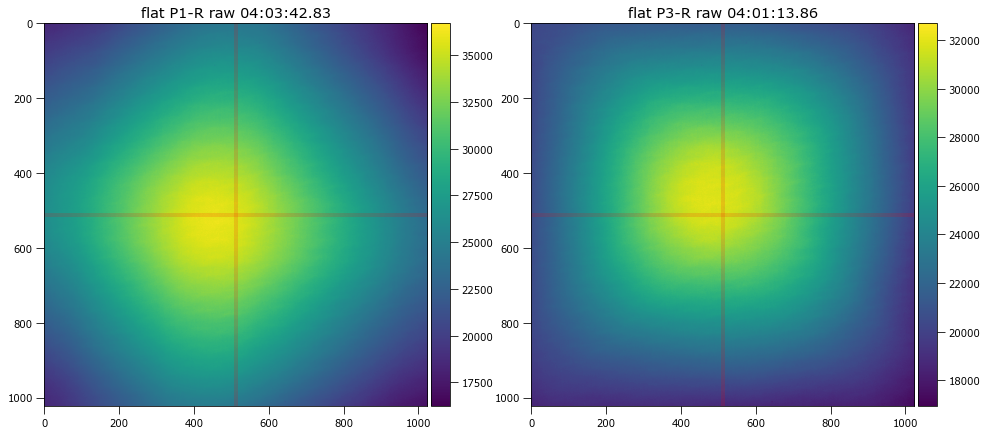

In [14]:
#g191b2b
p1_filter = 50
p3_filter = 74
funcs_calib_and_plot.plot_raw_double_compare(astropy.io.fits.open(flat[p1_filter]), astropy.io.fits.open(flat[p3_filter]), [512, 512, 512, 512], False, False)

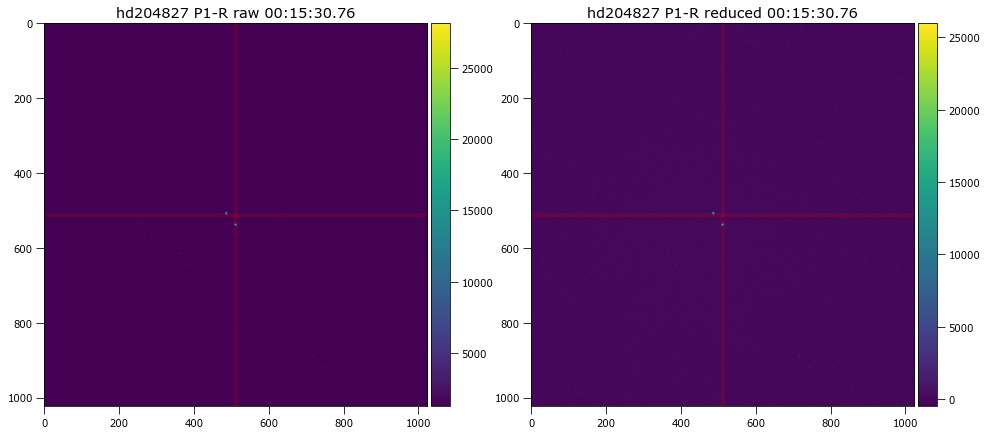

<Figure size 1008x1008 with 0 Axes>

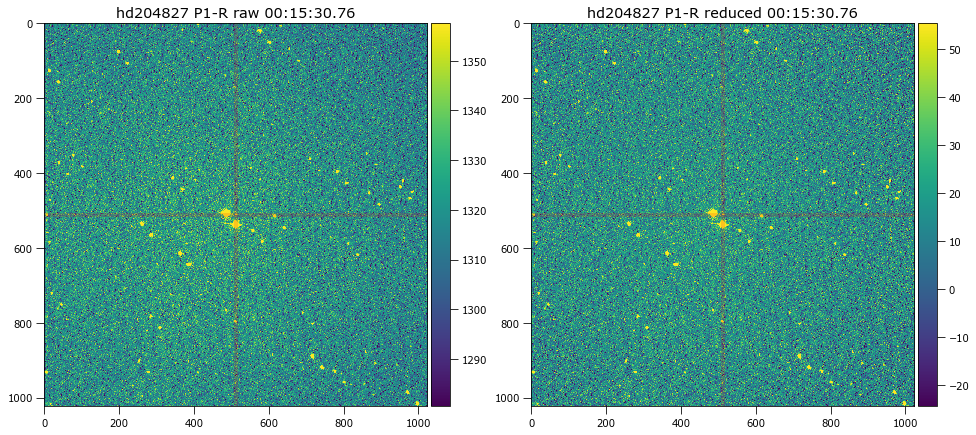

<Figure size 1008x1008 with 0 Axes>

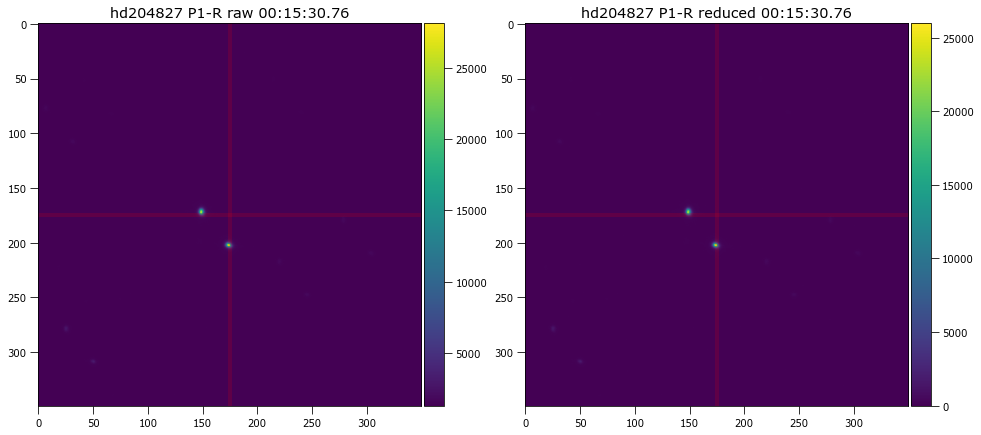

<Figure size 1008x1008 with 0 Axes>

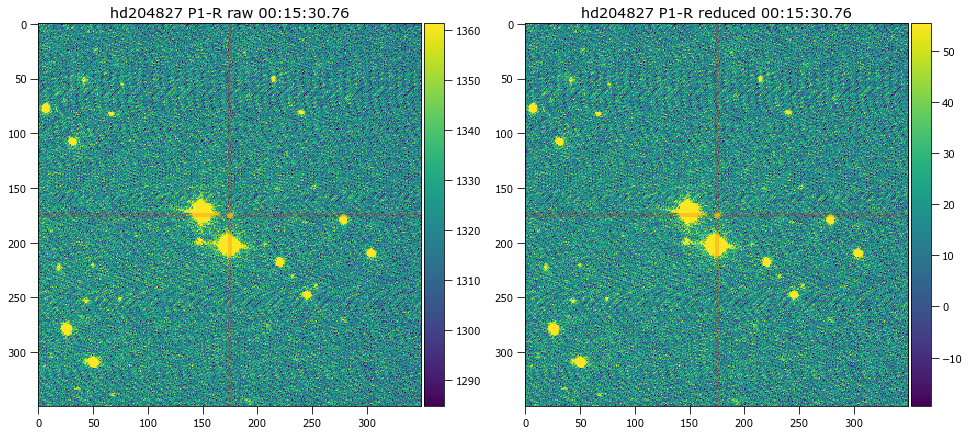

<Figure size 1008x1008 with 0 Axes>

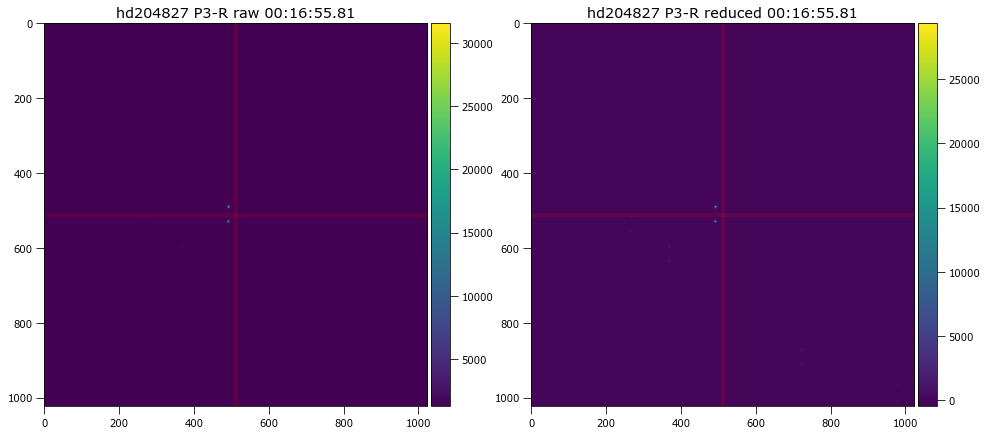

<Figure size 1008x1008 with 0 Axes>

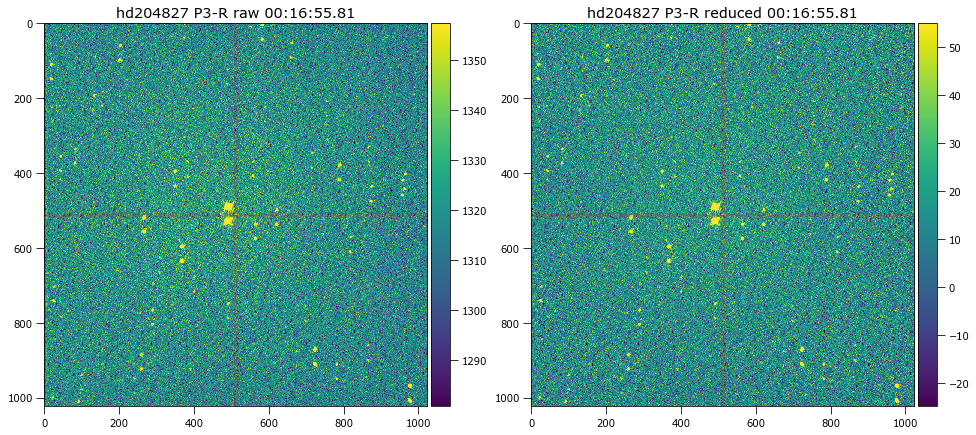

<Figure size 1008x1008 with 0 Axes>

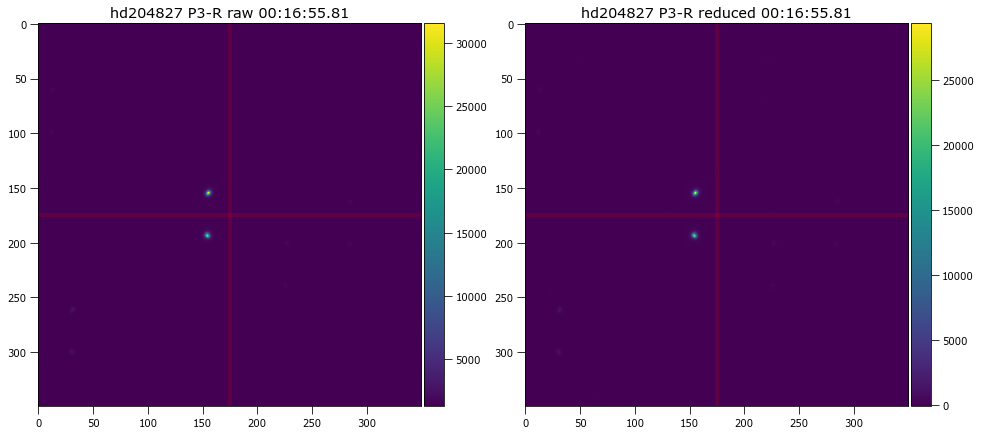

<Figure size 1008x1008 with 0 Axes>

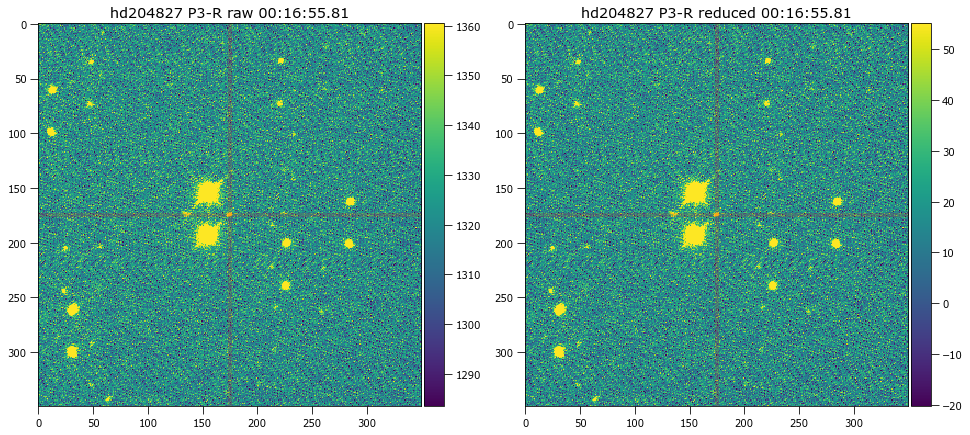

<Figure size 1008x1008 with 0 Axes>

In [9]:
#g191b2b
p1_filter = 34
p3_filter = 69

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p1_filter]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True)

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p1_filter]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True)
#Zoom
reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p1_filter]),
                                    [512, 512, 175, 175], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True)

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p1_filter]),
                                    [512, 512, 175, 175], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True)

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p3_filter]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True)

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p3_filter]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True)

#Zoom
reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p3_filter]),
                                    [512, 512, 175, 175], 
                                    (m_biast, m_dark, m_flat), 
                                    False, True, True)

reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[p3_filter]),
                                    [512, 512, 175, 175], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True)


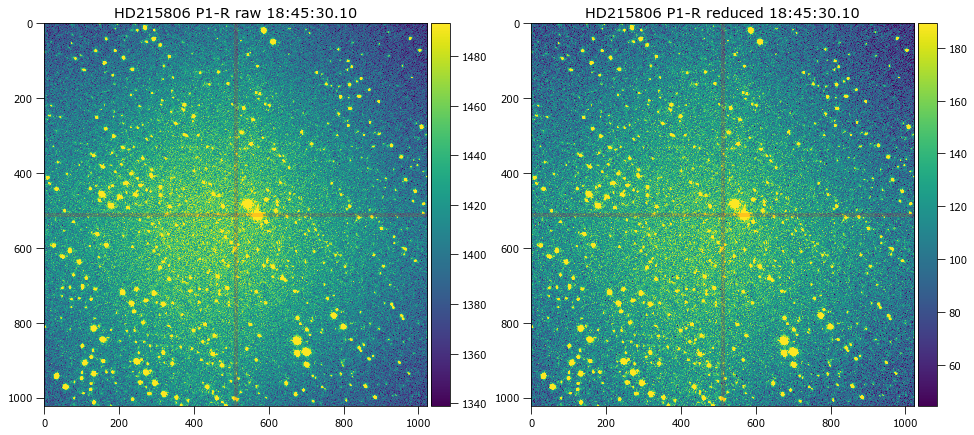

<Figure size 1008x1008 with 0 Axes>

In [103]:
reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[45]),
                                    [512, 512, 512, 512], 
                                    (m_biast, m_dark, m_flat), 
                                    True, True, True)

178 peaks detected from image of size 1024 x 1024 with sigma: 4 and second threshold: 591.2423764798019
Targets within region of interest:  4


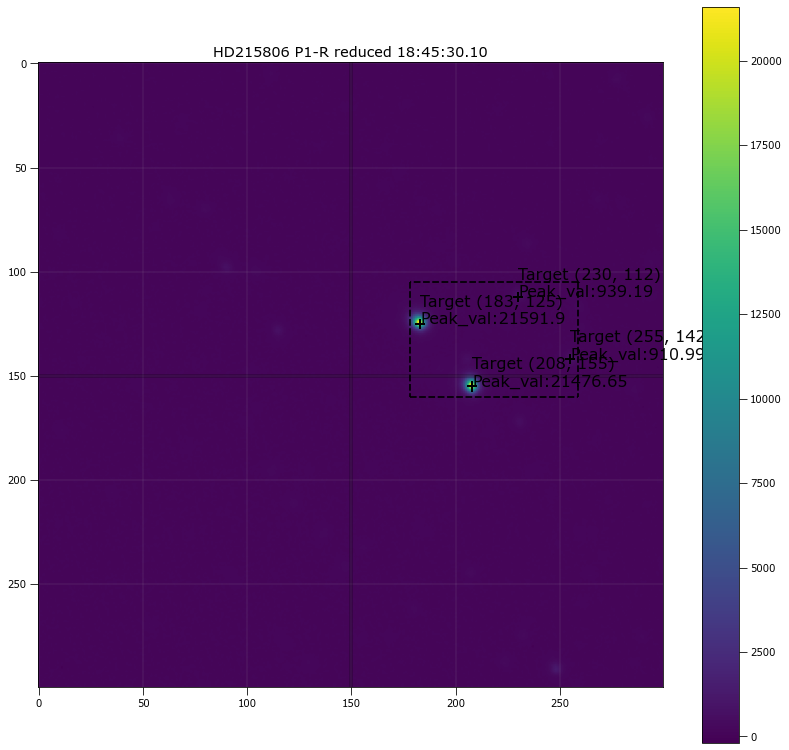

Aperture positions are: [(592, 474), (545, 487), (617, 504), (570, 517)] from the 1024 x 1024 image
Aperture positions are: [(230, 112), (183, 125), (255, 142), (208, 155)] from the 150 x 150 image


In [104]:
search_off = 150
search_bracket = [45, 10, -28, 109]
x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj,4,search_bracket, 500 , False, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True, False)

#Increase the first Threshold to get general population
#Increase the second threshold to get population within the box

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

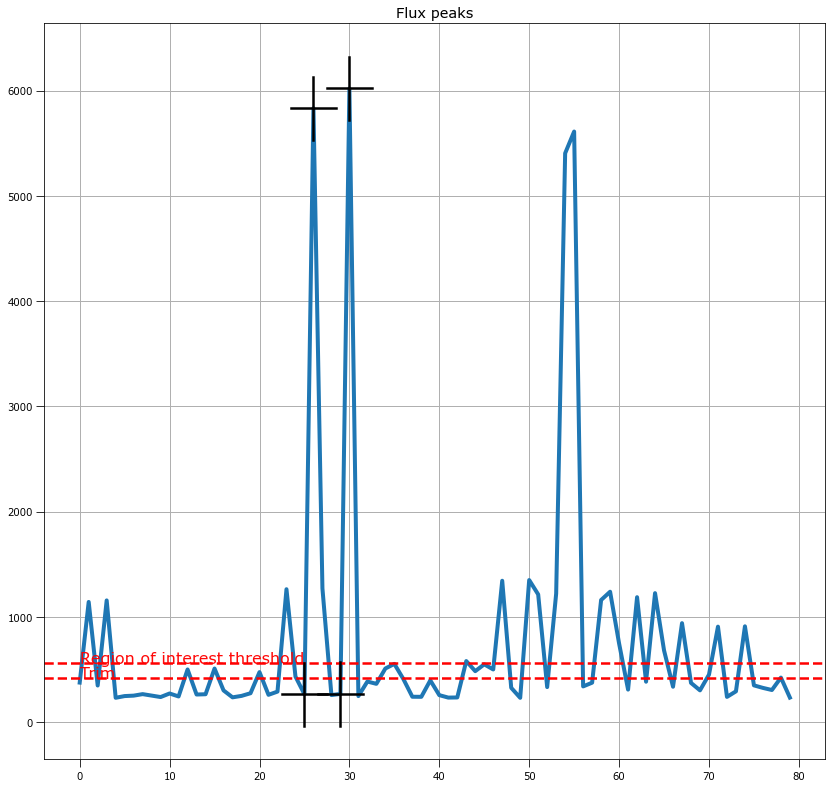

80 peaks detected from image of size 1024 x 1024 with sigma: 7 and threshold: 559.9784882714678 valid
Targets within region of interest:  2


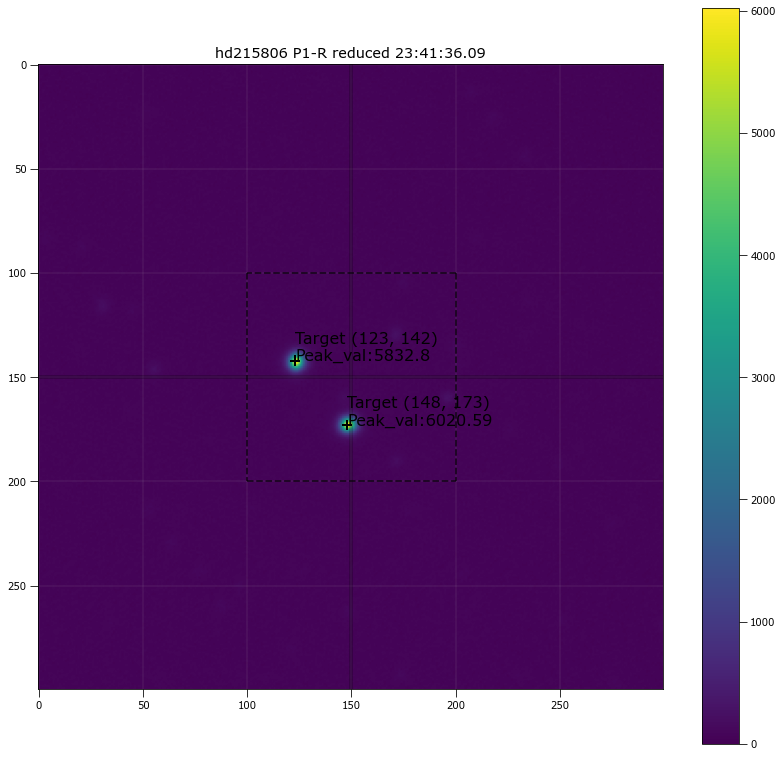

Aperture positions are: [(485, 504), (510, 535)] from the 1024 x 1024 image
Aperture positions are: [(123, 142), (148, 173)] from the 150 x 150 image


In [21]:
search_off = 150
search_bracket = [50, 50, 50, 50]
x_targ, y_targ, peak_targ  = funcs_star_finder.source_peak_finder(reduced_obj,7,search_bracket, 420.8 , True, True) #what do I return from this?
apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket,x_targ, y_targ, peak_targ, True)

apt_positions = []
for h in range(0 , len(x_targ)):
    apt_positions.append((x_targ[h], y_targ[h])) #This must undergo some translation    
    
print("Aperture positions are:", apt_positions, "from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print("Aperture positions are:", apt_pos, "from the", str(search_off), "x", str(search_off) ,"image")

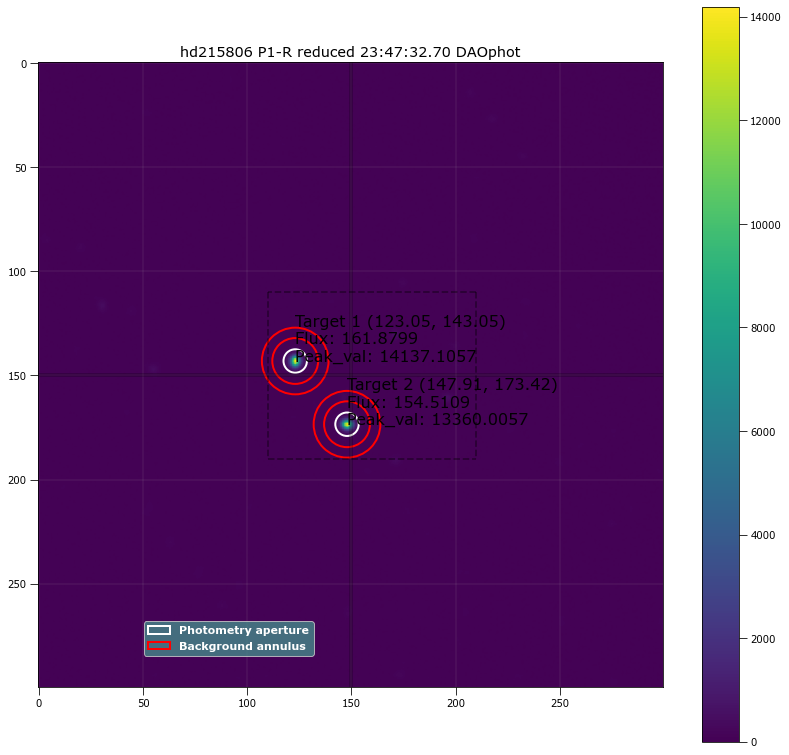

In [10]:
#DAO star finder
siegma_search = 2
DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2000, 150, 5.62, 11 , 16, True, False) #siegma and offset
#print("Positions of aperture from DAO",DAO_positions, "within the region of interest")
#phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 100, DAO_positions,  5.62, 11 , 17, False  )

In [11]:
#Its like an injection, make the output of the first star finder equal to the input of DAO starfinder

print("Results of the First Star Finder:")
print(apt_positions, "aperture positions from the", reduced_obj[0].header['NAXIS1'], "x", reduced_obj[0].header['NAXIS2'], "image")
print(apt_pos, "aperture positions from the", str(search_off), "x", str(search_off) ,"image")
print("\n")
print([list(x) for x in  DAO_positions], "\naperture positions from DAO positions")

Results of the First Star Finder:
[(533, 492), (485, 505), (558, 522), (510, 536)] aperture positions from the 1024 x 1024 image
[(171, 130), (123, 143), (196, 160), (148, 174)] aperture positions from the 150 x 150 image


[[123.0537785302438, 143.0542072406713], [147.91333858258204, 173.4163267738037]] 
aperture positions from DAO positions


Good radii: 4.559322033898305


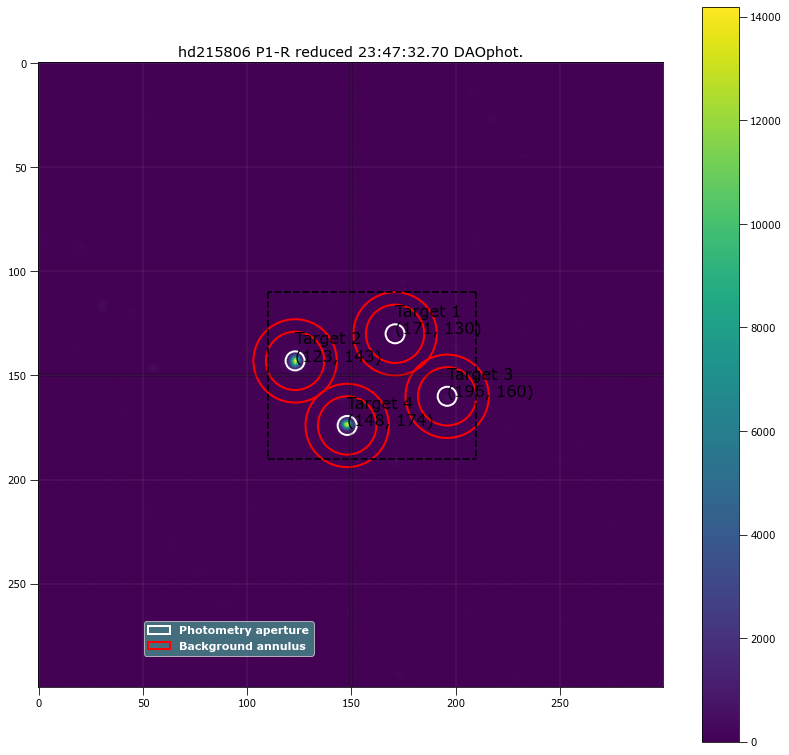

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     171     130 ...          175.65998      38936.627          158.06419
  2     123     143 ...          4055.9628      40917.198          165.30013
  3     196     160 ...          169.94514      39250.404          161.15725
  4     148     174 ...          3978.6688      44495.686          186.71545

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     171     130 ...                 159.55338             7742.9941
  2     123     143 ...                 4039.1189             230931.28
  3     196     160 ...          

In [12]:
trial_radii = np.linspace(3.0, 7, num=60) #tries different radii
target_a = []
target_b = []
target_c = []
target_d = []

for radii in trial_radii:
    #Its this loop thats taking up the compute time
    DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search , 2500, 150, 5.62, 11 , 16, False, False) 
    
    #print("DAO positions original:", len(DAO_positions) )
    
    if (len(DAO_positions) != 4):
        DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)
    
    #print("New DAO positions:", len(DAO_positions))
    
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150,search_bracket , DAO_positions, radii, 14 , 20, False,False)
    target_a.append(phot_tab['residual_aperture_sum'][0])
    target_b.append(phot_tab['residual_aperture_sum'][1])
    target_c.append(phot_tab['residual_aperture_sum'][2])
    target_d.append(phot_tab['residual_aperture_sum'][3])
    
combine_target = [target_a, target_b, target_c, target_d]

good_radii=funcs_apt_phot.solve_apt(combine_target, trial_radii, False)

print("Good radii:",good_radii)

phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, 150, search_bracket ,DAO_positions,good_radii, 14 , 20, True, False)

P1-R Filter
Aperture radius for 18:42:52.50 is 4.559322033898305


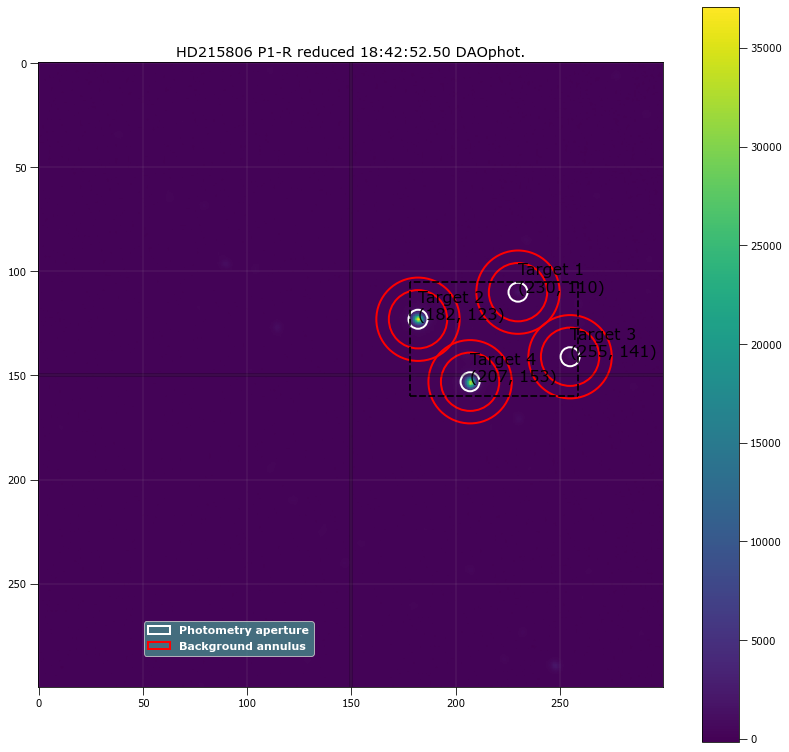

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     230     110 ...          448.12104        89743.8          358.23211
  2     182     123 ...          10336.177      97341.073          387.65157
  3     255     141 ...          421.91332      90681.939          366.33728
  4     207     153 ...          9893.6501      102577.66          417.14121

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     230     110 ...                  411.6175              20703.67
  2     182     123 ...                 10296.675              595116.6
  3     255     141 ...          

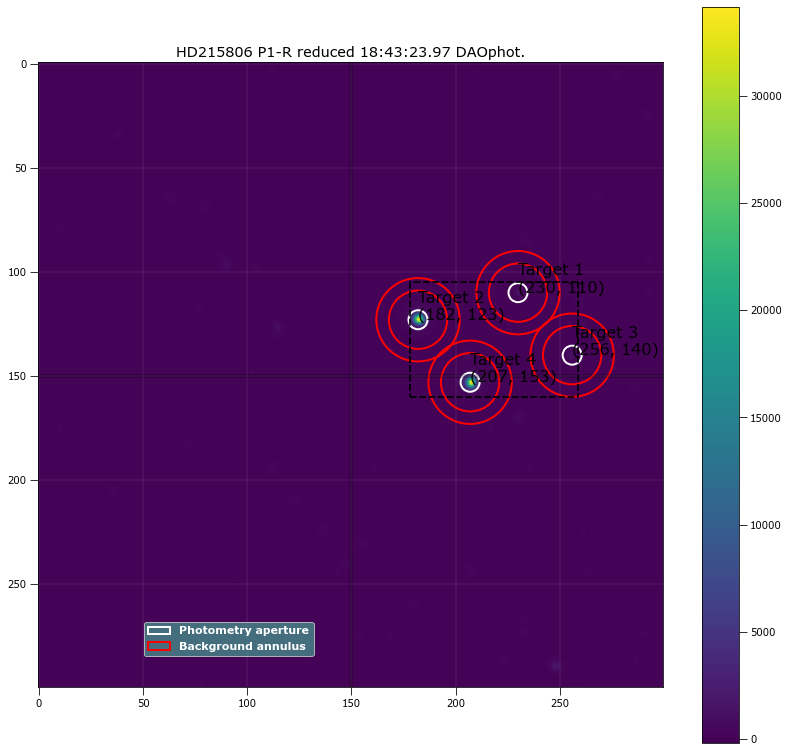

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     230     110 ...          448.23143      88881.348          354.75729
  2     182     123 ...          10156.342      97410.236          387.45176
  3     256     140 ...          432.52787      91737.168          370.69665
  4     207     153 ...          10005.476      102890.79          418.57811

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     230     110 ...                 412.08198             20617.694
  2     182     123 ...                 10116.861             594499.47
  3     256     140 ...          

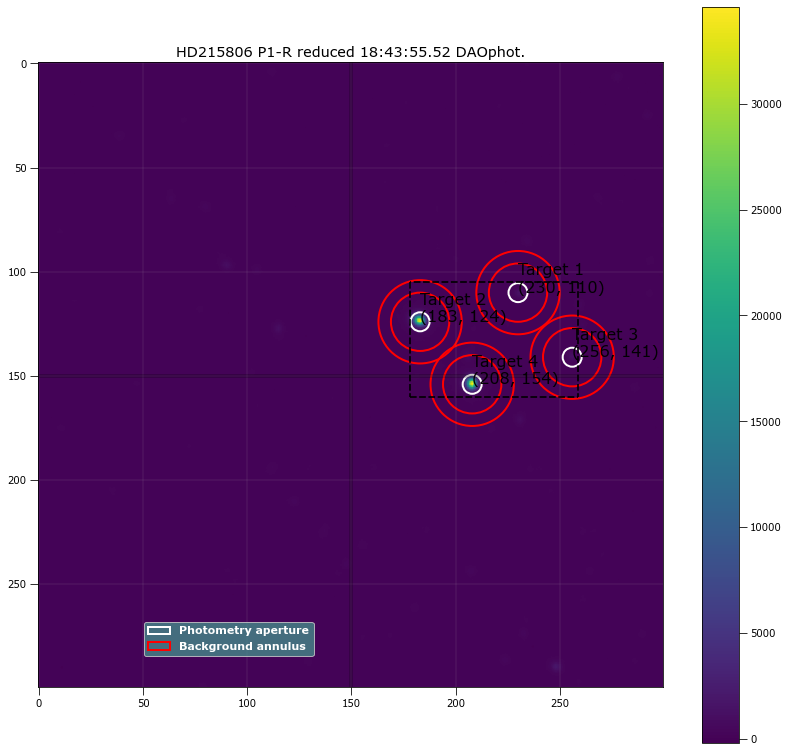

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     230     110 ...          444.62075      89511.666          357.30085
  2     183     124 ...          10083.846      97919.617           389.8392
  3     256     141 ...          424.82717      91602.742          370.39608
  4     208     154 ...          9962.2124      105154.42          434.85347

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     230     110 ...                 408.21211             20684.623
  2     183     124 ...                 10044.122             580504.56
  3     256     141 ...          

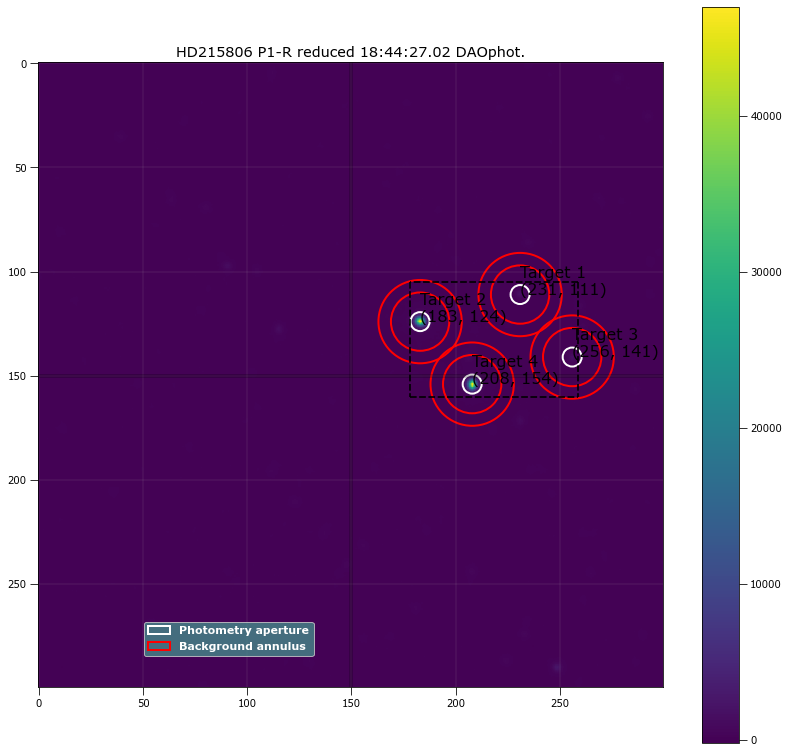

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     231     111 ...          491.76963      89366.938          357.39683
  2     183     124 ...          11855.644      97872.536          389.77516
  3     256     141 ...          476.01706      90901.879           370.1295
  4     208     154 ...          11648.507      103680.71          424.59888

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     231     111 ...                 455.35121             21509.562
  2     183     124 ...                 11815.927             620343.91
  3     256     141 ...          

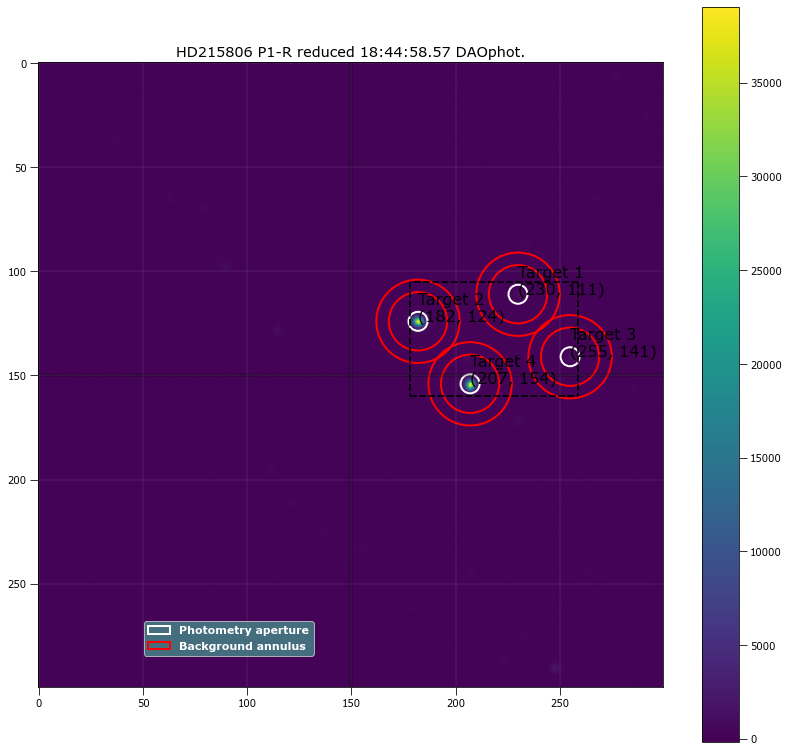

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     230     111 ...          467.30005      89162.782          356.33251
  2     182     124 ...          10853.916      97997.022          389.95641
  3     255     141 ...          450.05064      92174.761          372.65194
  4     207     154 ...          10645.884      102741.11          417.56245

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     230     111 ...                 430.99008             21303.558
  2     182     124 ...                  10814.18             601912.25
  3     255     141 ...          

IndexError: index 2 is out of bounds for axis 0 with size 2

<Figure size 1008x1008 with 0 Axes>

In [105]:
#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

#P1-R Filter
print("P1-R Filter")

res_apt_sum_list = []

start = 40
end = 75
filename = astropy.io.fits.open(pol_std[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(pol_std[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'pol_std 1 x center')
worksheet.write('F1', 'pol_std 1 y center')
worksheet.write('G1', 'pol_std 1 counts')
worksheet.write('H1', 'pol_std 1 error')
worksheet.write('I1', 'pol_std 2 x center')
worksheet.write('J1', 'pol_std 2 y center')
worksheet.write('K1', 'pol_std 2 counts')
worksheet.write('L1', 'pol_std 2 error')
worksheet.write('M1', 'pol_std 3 x center')
worksheet.write('N1', 'pol_std 3 y center')
worksheet.write('O1', 'pol_std 3 counts')
worksheet.write('P1', 'pol_std 3 error')
worksheet.write('Q1', 'pol_std 4 x center')
worksheet.write('R1', 'pol_std 4 y center')
worksheet.write('S1', 'pol_std 4 counts')
worksheet.write('T1', 'pol_std 4 error')
worksheet.write('U1', 'q')
worksheet.write('V1', 'q error')
worksheet.write('W1', 'u')
worksheet.write('X1', 'u error')
worksheet.write('Y1', 'PD')
worksheet.write('Z1', 'PD error')
worksheet.write('AA1', 'PA')
worksheet.write('AB1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [45, 10, -28, 109]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(3.0, 7, num=60)
    pol_std_a = []
    pol_std_b = []
    pol_std_c = []
    pol_std_d = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          2000, search_off, radii, 14 , 20, False, False)
        
        if (len(DAO_positions) != 4):
            x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj, 5, search_bracket, 700, False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        #Insert Trial
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        pol_std_a.append(phot_tab['residual_aperture_sum'][0])
        pol_std_b.append(phot_tab['residual_aperture_sum'][1])
        pol_std_c.append(phot_tab['residual_aperture_sum'][2])
        pol_std_d.append(phot_tab['residual_aperture_sum'][3])

    combine_pol_std = [pol_std_a, pol_std_b, pol_std_c, pol_std_d]
    
    #solve for good radii
    good_radii=funcs_apt_phot.solve_apt(combine_pol_std, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 14 , 20, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    #propagate the position forward
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3], "\n")
    
    write_this = [k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3]   ]

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

pol_std_1 = []
pol_std_2 = []
pol_std_3 = []
pol_std_4 = []

for things in res_apt_sum_list:
    pol_std_1.append(things[0])
    pol_std_2.append(things[1])
    pol_std_3.append(things[2])
    pol_std_4.append(things[3])

In [ ]:
#If its too low the threshold is nan. and thats one of the reason it throws a wobbly

In [ ]:
#You have to do a manual Fit before you do a physical fit.
#Call it "The split pair, call it the extraordinary ray."

P3-R Filter
Aperture radius for 18:43:08.28 is 4.559322033898305


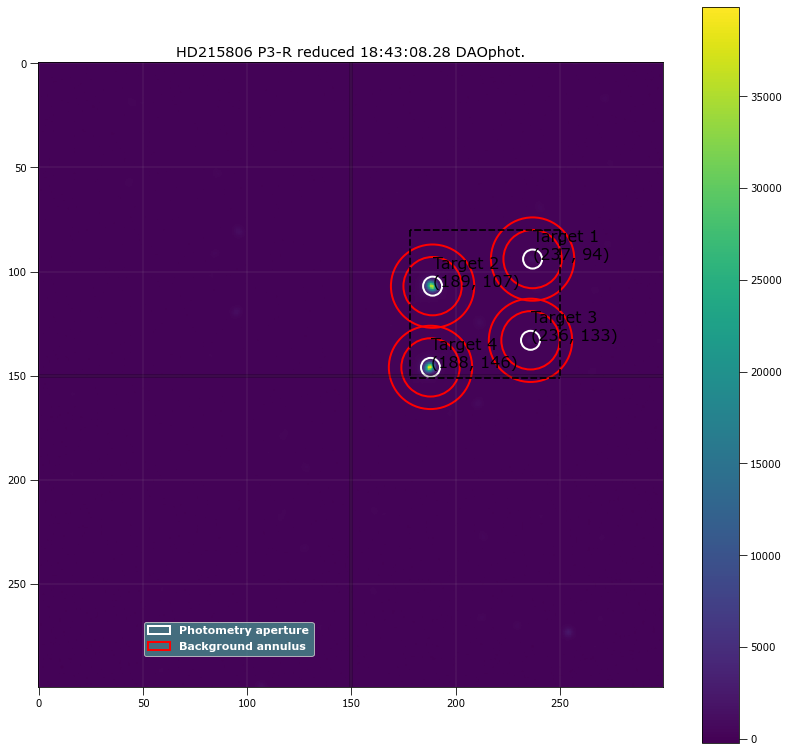

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      94 ...          462.36507      93866.877          383.65146
  2     189     107 ...              10641      99855.276          398.38549
  3     236     133 ...          464.88656      90970.839          361.87209
  4     188     146 ...          10839.004      98654.496          394.05863

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      94 ...                 423.27133             20979.442
  2     189     107 ...                 10600.405             598986.33
  3     236     133 ...          

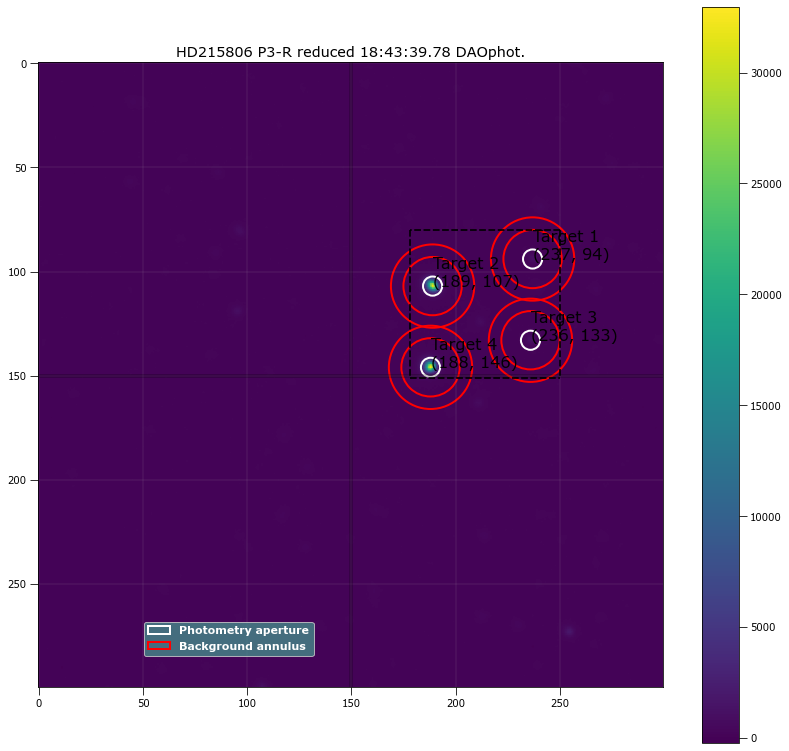

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      94 ...          429.62877      92172.728          373.17298
  2     189     107 ...          9687.9022       100306.8          399.99357
  3     236     133 ...          434.79014      89743.079          356.88417
  4     188     146 ...          9754.1865      98213.819          391.41634

 Aperture are: 66.28029476365643 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      94 ...                 391.03524             20257.692
  2     189     107 ...                 9646.5349              582425.1
  3     236     133 ...          

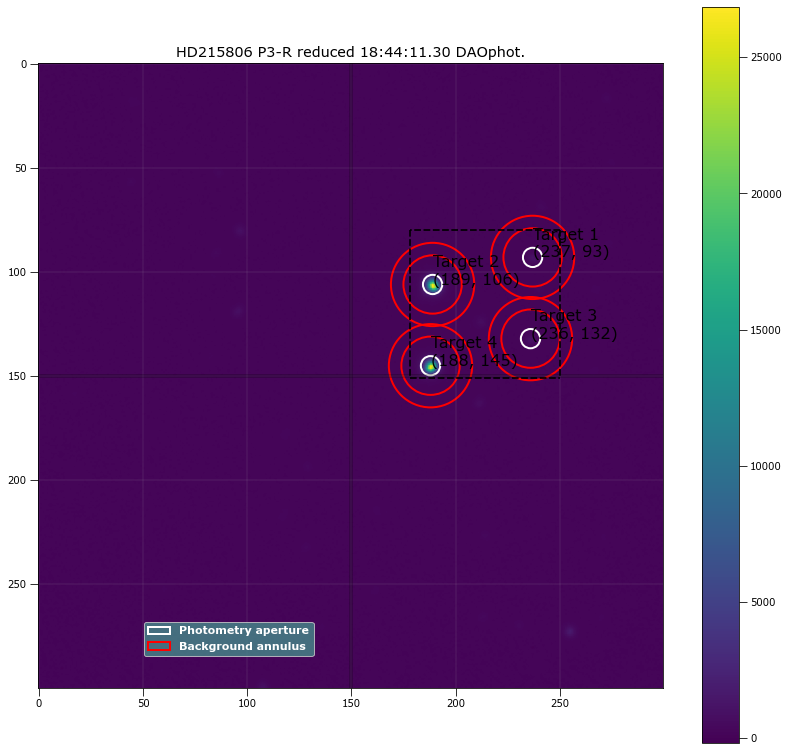

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      93 ...          407.19239      94698.528          383.26076
  2     189     106 ...          8793.7363      101539.22          404.50588
  3     236     132 ...          409.11274      90492.331            359.835
  4     188     145 ...          8721.7099      99725.815          397.37946

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      93 ...                 366.96837             19344.775
  2     189     106 ...                 8751.2826             554377.17
  3     236     132 ...          

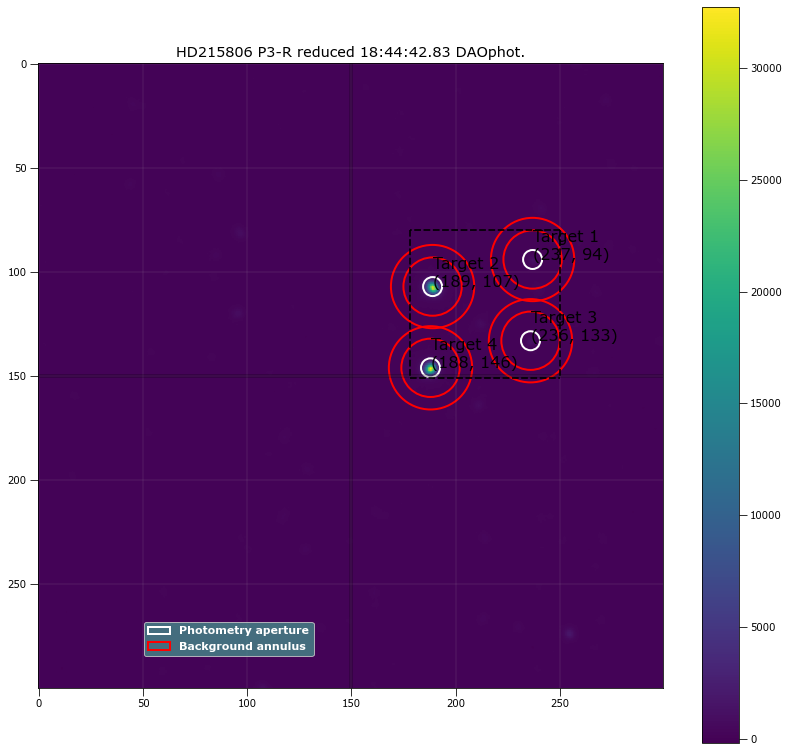

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      94 ...          427.64494      95171.045             386.26
  2     189     107 ...          9588.6663      100736.63           401.6212
  3     236     133 ...           438.6615      91072.479          362.11202
  4     188     146 ...          9763.1128      99538.831          397.08685

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      94 ...                 388.28539              20072.27
  2     189     107 ...                 9547.7415             578522.04
  3     236     133 ...          

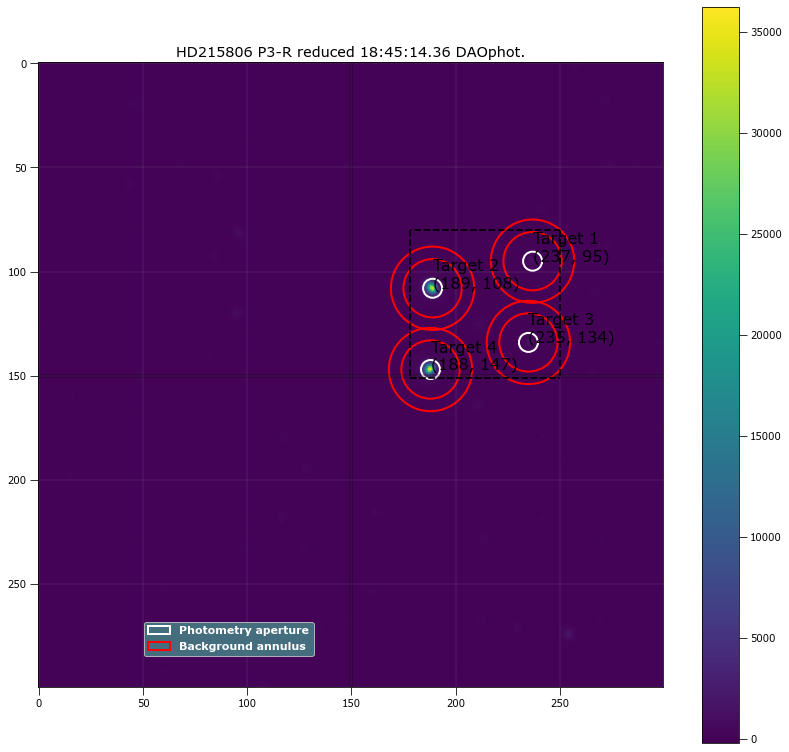

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      95 ...          446.31038      93593.387          378.88504
  2     189     108 ...          10027.558      101382.52           404.2984
  3     235     134 ...          456.02847      90488.221          359.84026
  4     188     147 ...          10260.527      99784.329          398.14567

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      95 ...                 407.70233             20499.611
  2     189     108 ...                 9986.3607             584572.82
  3     235     134 ...          

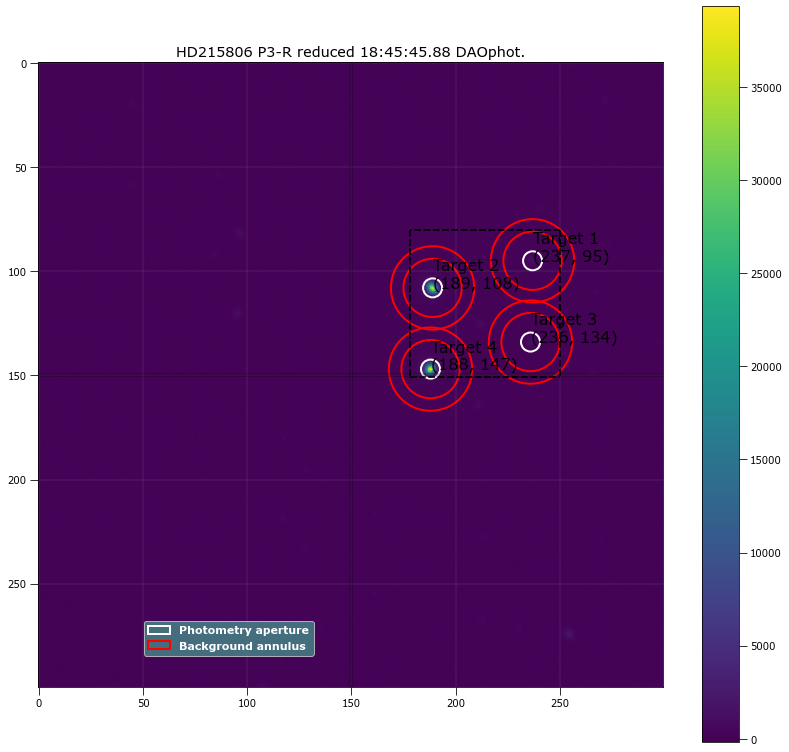

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      95 ...           445.8486      94942.499          385.63136
  2     189     108 ...          10364.243      101966.72          406.71622
  3     236     134 ...          452.56497      91253.171          362.84988
  4     188     147 ...          10597.555      101015.03          402.84621

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      95 ...                 406.55311             20084.245
  2     189     108 ...                 10322.799             591395.52
  3     236     134 ...          

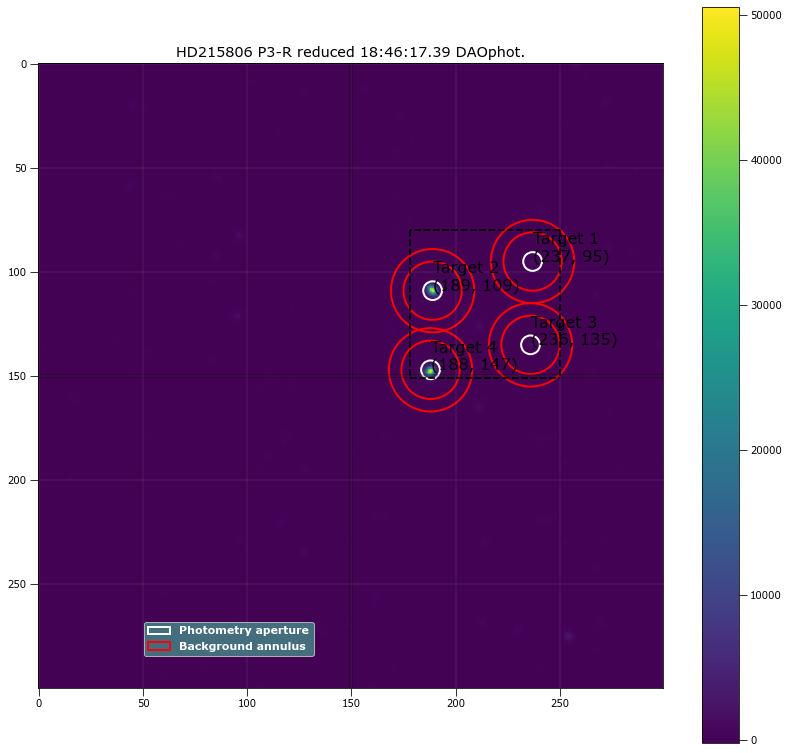

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      95 ...          520.02556      95483.731          396.31875
  2     189     109 ...          12663.936      100030.87          399.80347
  3     236     135 ...          518.26101      90856.996          361.25544
  4     188     147 ...          12798.183      99406.912          397.95558

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      95 ...                 480.83313             21844.761
  2     189     109 ...                 12624.399             637256.76
  3     236     135 ...          

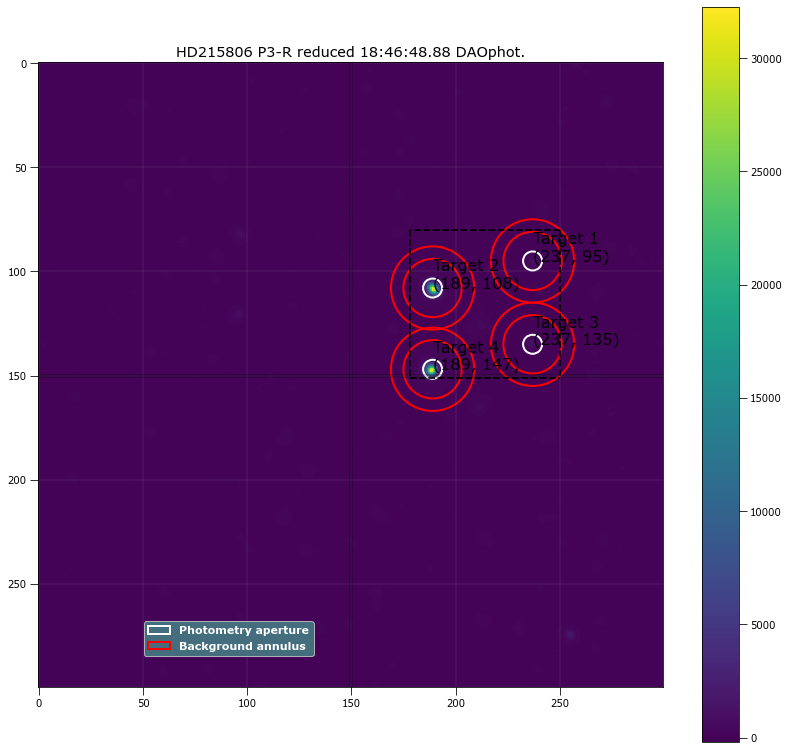

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      95 ...          439.32253       95361.67           388.2752
  2     189     108 ...          9866.3907      102316.32          407.60234
  3     237     135 ...          439.40739      91798.618          365.11797
  4     189     147 ...          9787.4735      101361.04          404.86363

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      95 ...                 399.75763             20393.342
  2     189     108 ...                 9824.8564             583662.26
  3     237     135 ...          

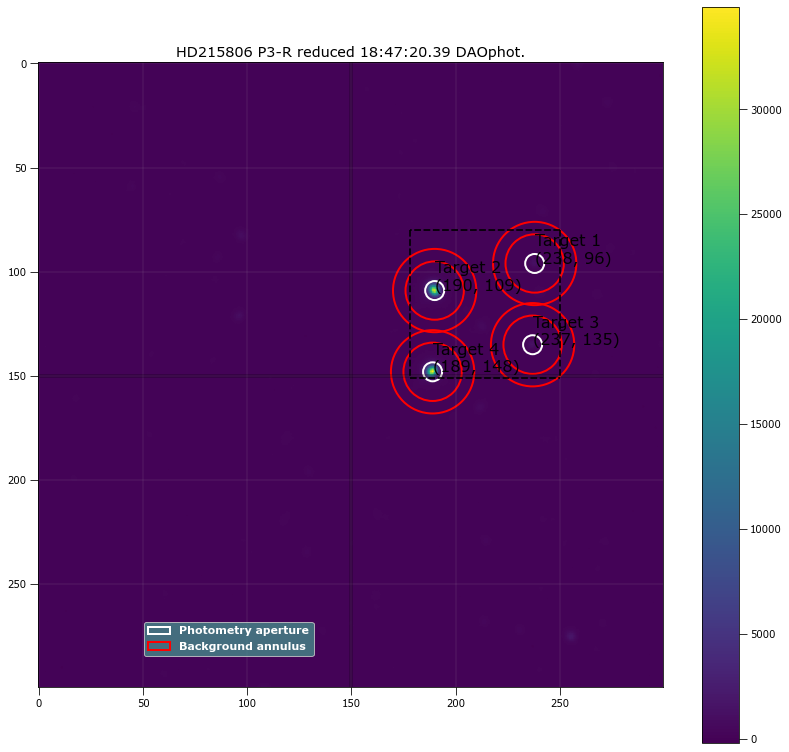

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      96 ...          434.84776      93748.007          379.94311
  2     190     109 ...          9865.0541      102121.23          407.24706
  3     237     135 ...           439.6806      90307.453          359.34532
  4     189     148 ...          9971.7156      101055.03           403.0312

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      96 ...                  396.1319             20161.829
  2     190     109 ...                  9823.556             584641.78
  3     237     135 ...          

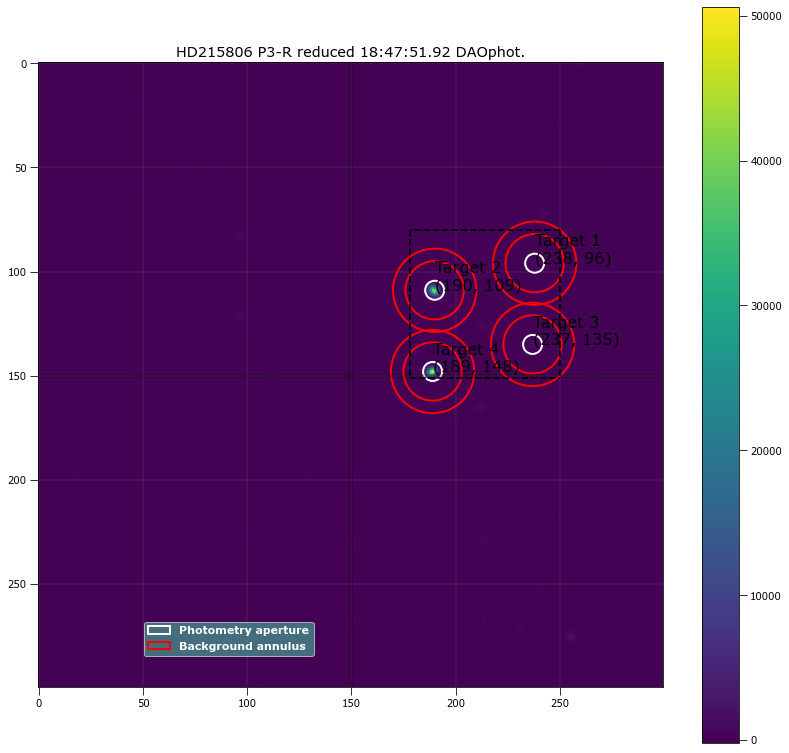

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      96 ...          501.68007      94604.513          388.92115
  2     190     109 ...          11830.824      100922.12          403.32831
  3     237     135 ...          517.80608      91388.572          363.64091
  4     189     148 ...          12326.592      99634.463          397.85157

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      96 ...                 462.04935             21785.206
  2     190     109 ...                 11789.726              623767.5
  3     237     135 ...          

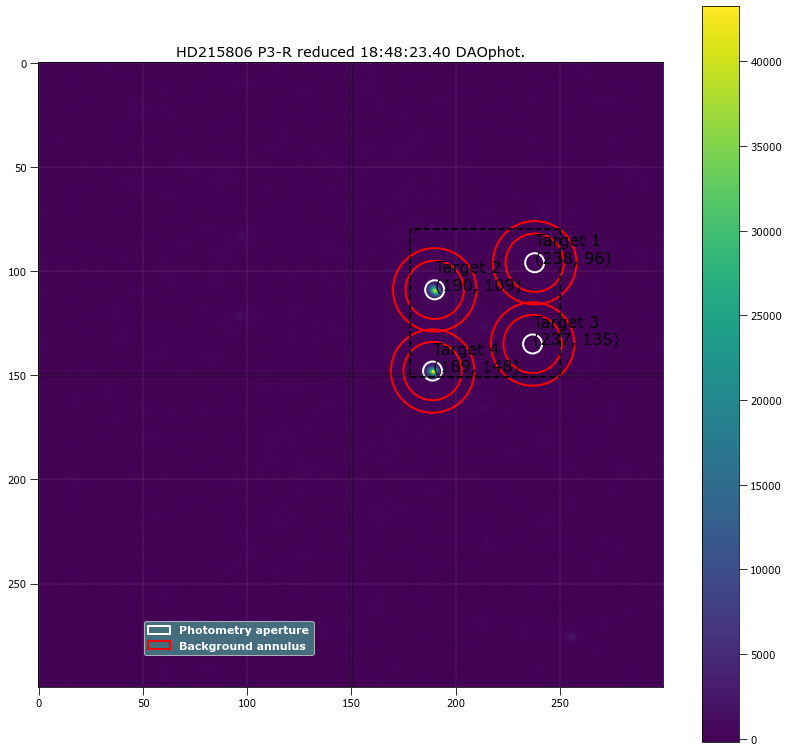

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      96 ...           472.7557      94590.807          387.10567
  2     190     109 ...          11024.301       101348.1          404.24525
  3     237     135 ...           479.0332      90924.455          362.00308
  4     189     148 ...          11305.997       99619.85          397.28462

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      96 ...                 433.30998             21202.029
  2     190     109 ...                 10983.109             615908.26
  3     237     135 ...          

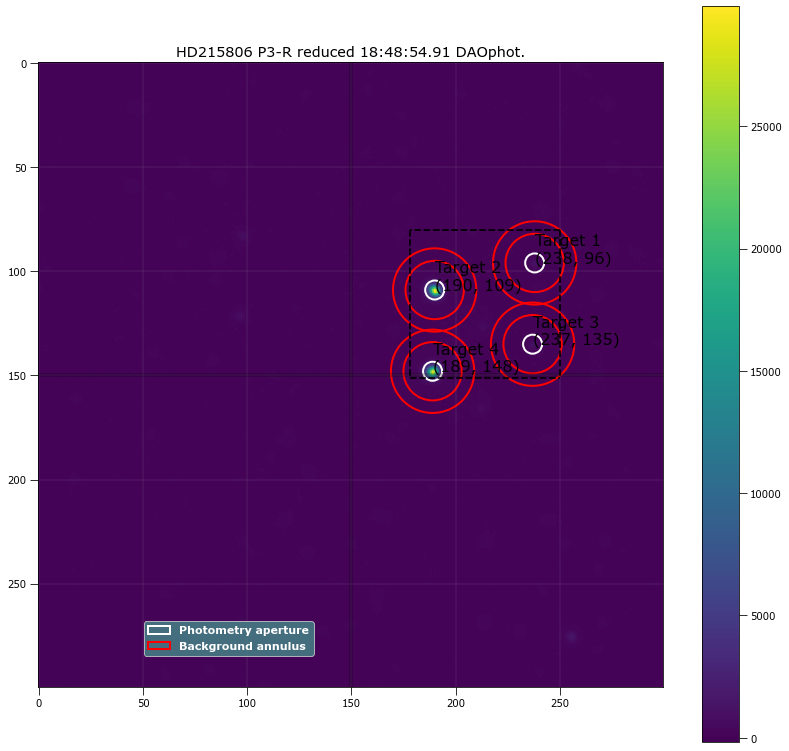

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      96 ...          425.62262      95446.347          387.01754
  2     190     109 ...          9506.8606      103212.54          410.86703
  3     237     135 ...          424.31517      91457.676          363.58296
  4     189     148 ...          9291.5584      101558.91          404.77225

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      96 ...                 386.18588             20052.435
  2     190     109 ...                 9464.9936             580909.97
  3     237     135 ...          

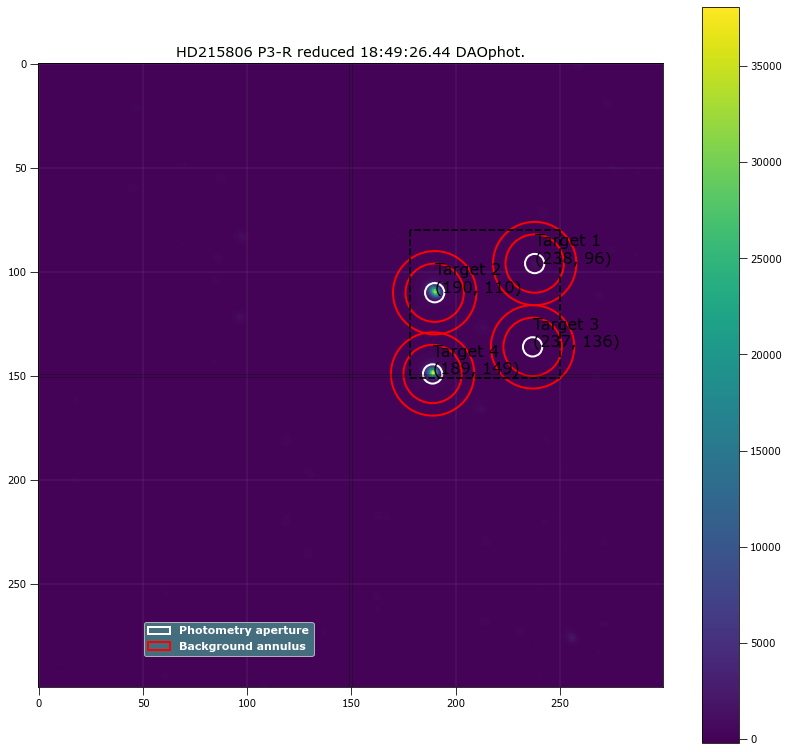

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      96 ...          435.01197       95923.41            391.947
  2     190     110 ...          9968.3162      102074.16          407.04273
  3     237     136 ...           451.6508      92023.997          365.87618
  4     189     149 ...           10321.85      101507.25          404.32108

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      96 ...                 393.87632             19978.839
  2     190     110 ...                 9925.5962             582610.91
  3     237     136 ...          

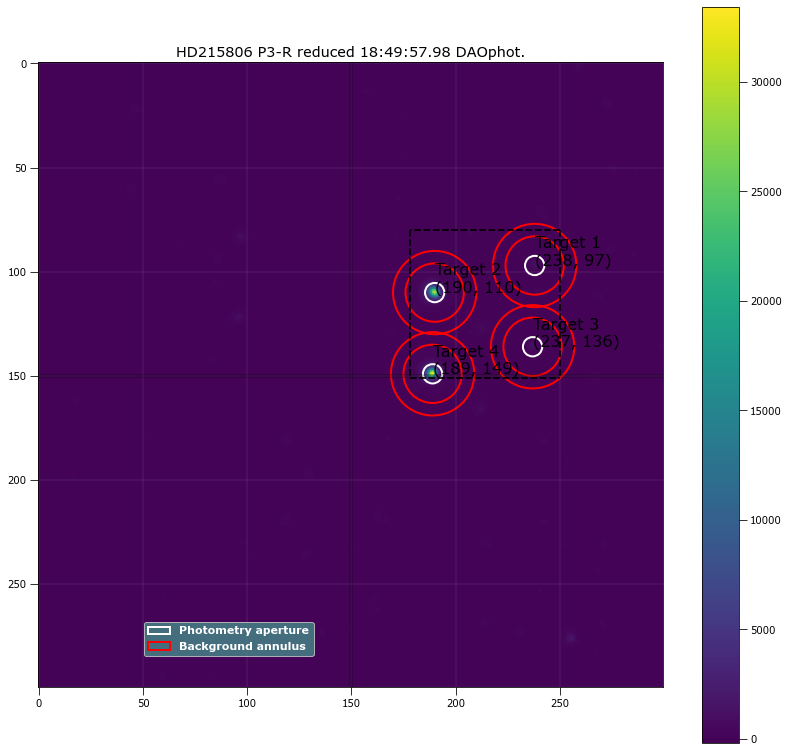

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      97 ...          410.02829      95278.689          384.57605
  2     190     110 ...          9152.6861      104538.49           417.0901
  3     237     136 ...          421.85321       91608.34          364.39969
  4     189     149 ...          9330.1897      102871.34          409.89197

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      97 ...                 369.66623             18748.979
  2     190     110 ...                 9108.9117             551678.12
  3     237     136 ...          

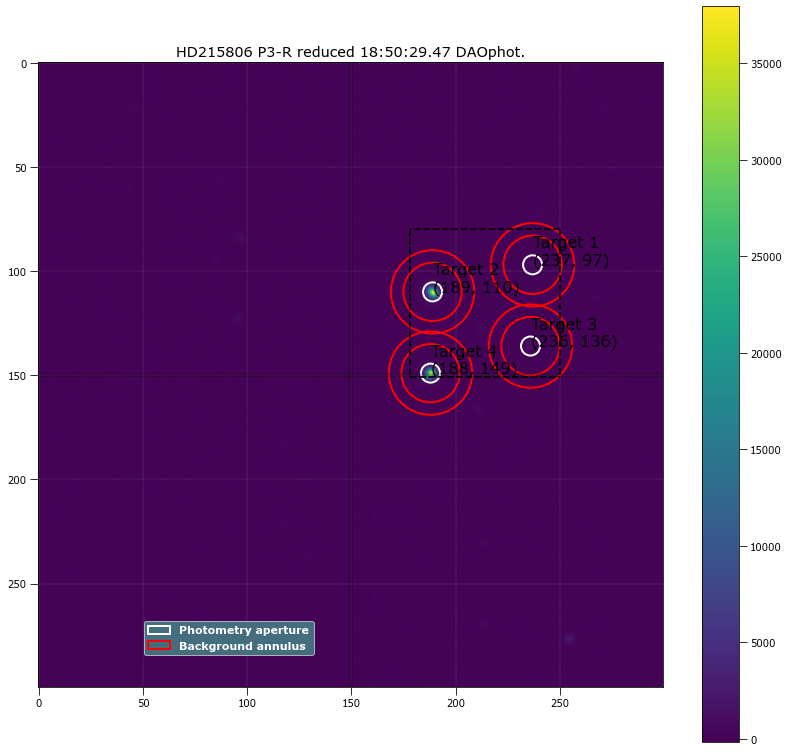

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      97 ...          463.56743      95448.958          388.71853
  2     189     110 ...          10583.629      101960.49          406.84665
  3     236     136 ...           463.3914      92349.871          367.00353
  4     188     149 ...          10591.027      100357.62          400.00984

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      97 ...                 423.95736             21136.552
  2     189     110 ...                 10542.172             607352.75
  3     236     136 ...          

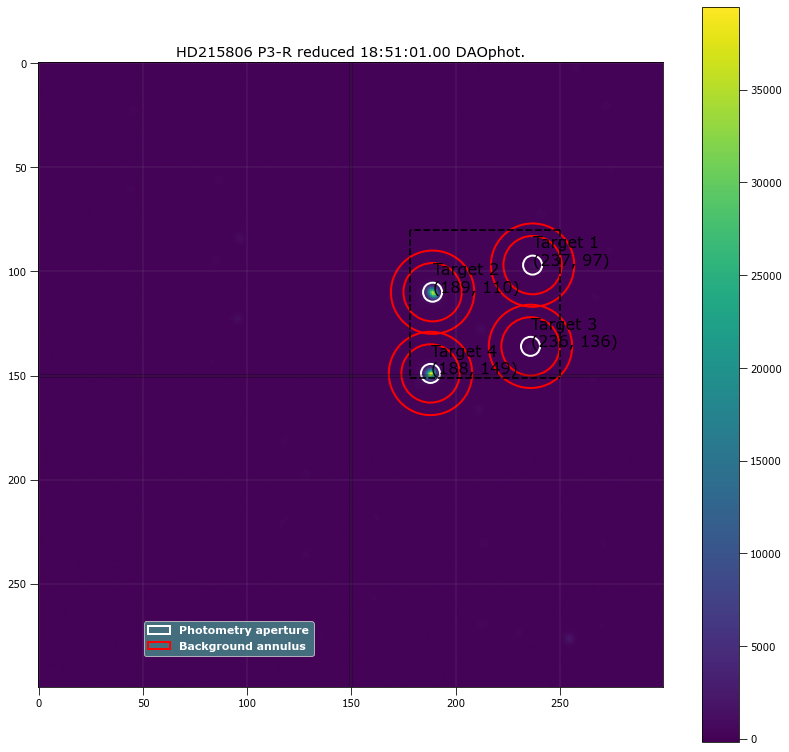

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      97 ...          457.33228        95736.4          392.39515
  2     189     110 ...          10533.525      101349.45          404.25196
  3     236     136 ...          469.44956      91823.527          365.03277
  4     188     149 ...          10784.873      100816.86          401.95113

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      97 ...                 417.34756             20780.174
  2     189     110 ...                 10492.332             606168.65
  3     236     136 ...          

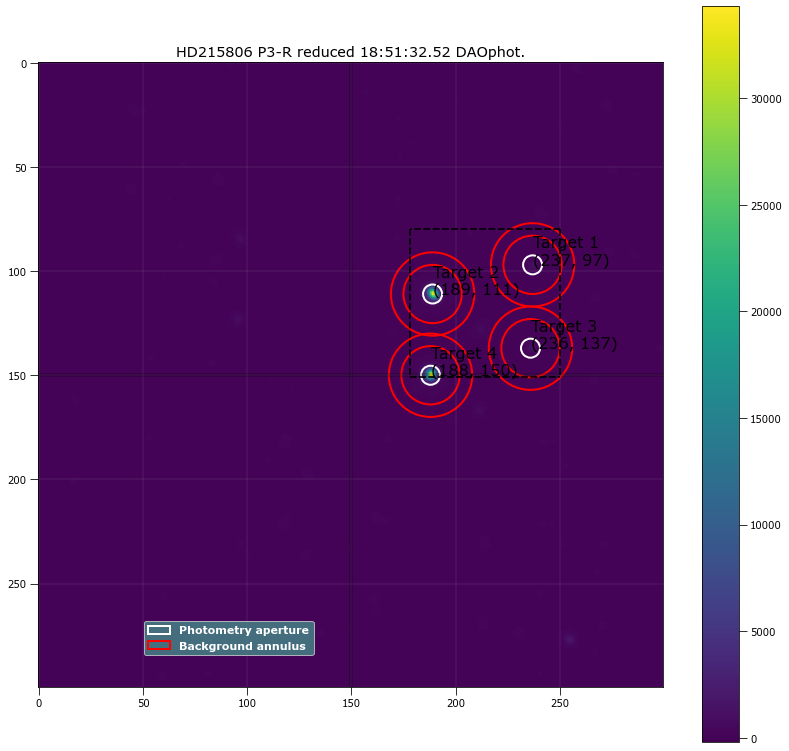

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      97 ...          441.34361      95272.701          387.94203
  2     189     111 ...          10119.353      101006.24            402.715
  3     236     137 ...          442.69102      91345.144          363.15111
  4     188     150 ...          10150.223       99663.14          397.00144

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      97 ...                 401.81266             20582.267
  2     189     111 ...                 10078.317             598452.67
  3     236     137 ...          

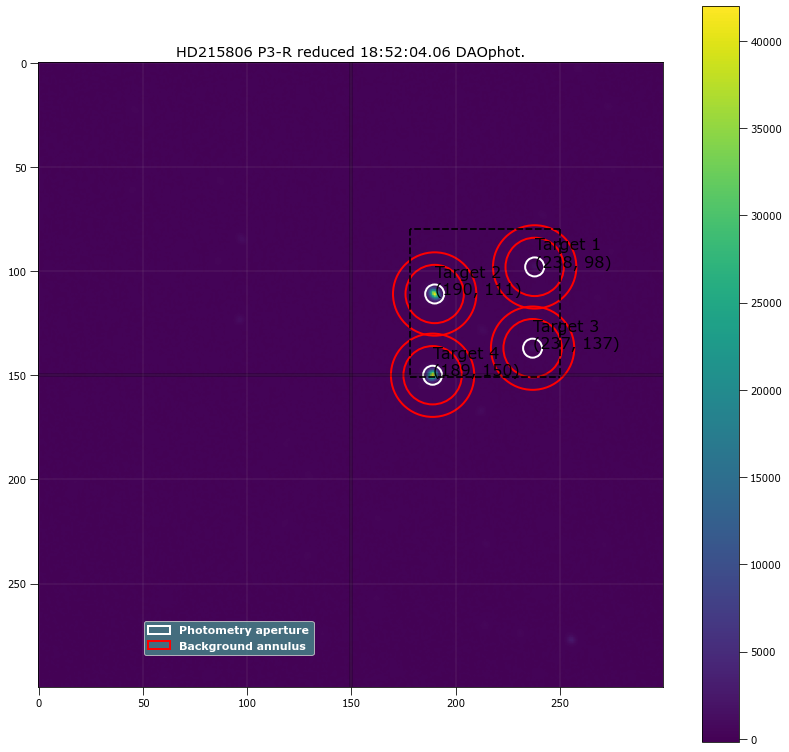

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      98 ...          480.48649      96003.203          389.32408
  2     190     111 ...          11223.763      101142.61          403.60853
  3     237     137 ...          484.97802      91156.666          362.56163
  4     189     150 ...          11277.795      100555.77          400.75618

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      98 ...                 440.81471             21144.999
  2     190     111 ...                 11182.635             613545.62
  3     237     137 ...          

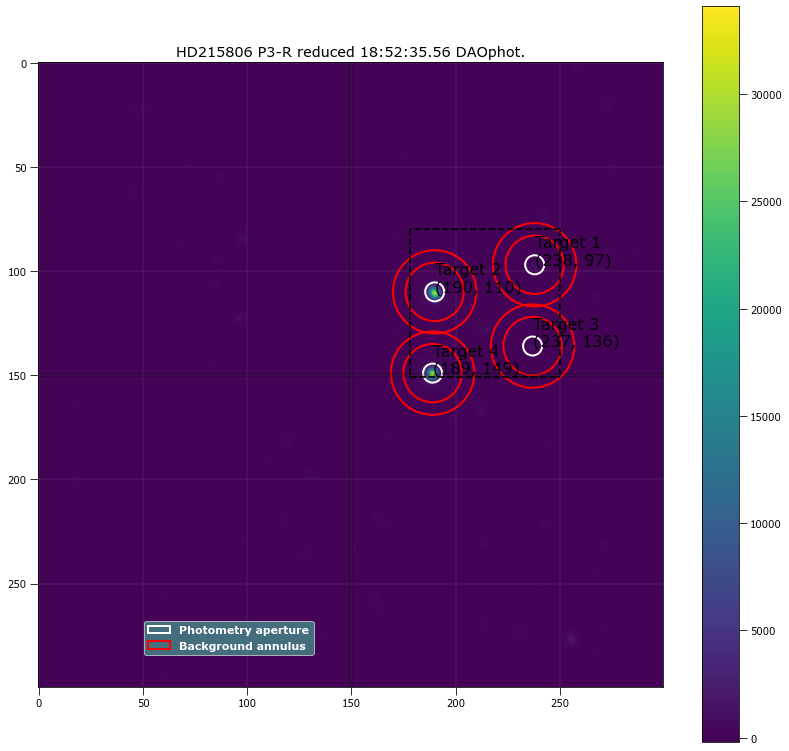

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      97 ...          426.31892      95525.536          387.68737
  2     190     110 ...          9605.4651      101845.04          405.97592
  3     237     136 ...          435.02687      91667.499          364.65237
  4     189     149 ...          9862.2521      101438.42          404.25017

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      97 ...                 386.81392             19834.897
  2     190     110 ...                 9564.0965             581713.86
  3     237     136 ...          

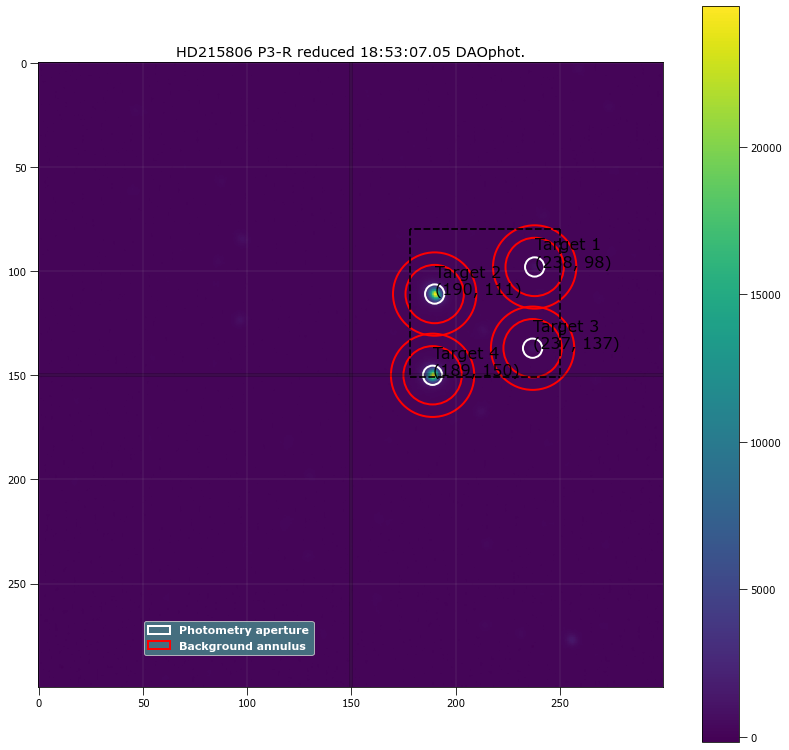

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     238      98 ...          392.68325      94341.022          380.31338
  2     190     111 ...          8344.7535      104771.12          416.94792
  3     237     137 ...          394.72529      92034.018           365.9699
  4     189     150 ...          8230.9379      102461.35          407.78566

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     238      98 ...                 352.76857             18846.063
  2     190     111 ...                 8300.9939             537983.41
  3     237     137 ...          

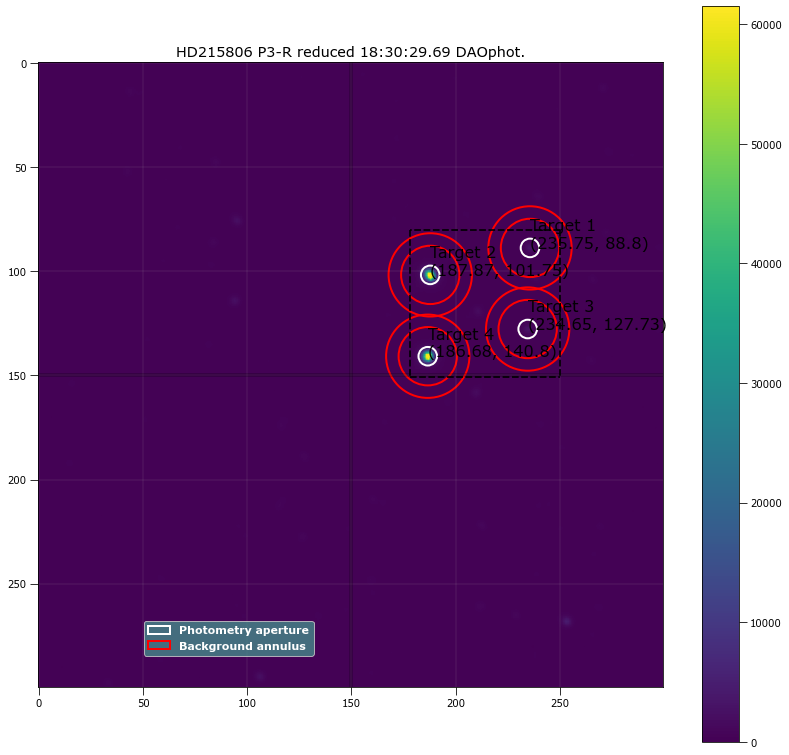

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 235.75422 88.804251 ...          935.92961      186841.38          756.94089
  2 187.87265 101.75121 ...          21003.211      197861.34          786.89281
  3 234.64519 127.73245 ...          933.01442      180260.06          713.80098
  4 186.68264 140.79717 ...          20678.262      195948.34          778.86203

 Aperture are: 62.42482684750139 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 235.75422 88.804251 ...                 862.20045             41897.444
  2 187.87265 101.75121 ...                 20926.564        

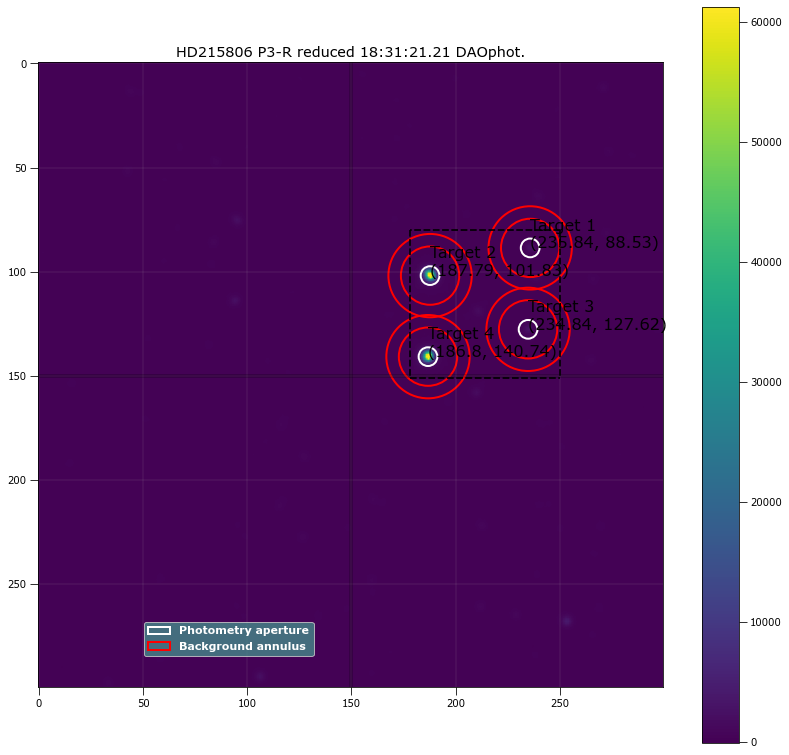

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 235.83826 88.532304 ...           901.9811      186729.63           757.0325
  2 187.78677 101.83269 ...          20394.269      199730.38           793.7016
  3 234.83891 127.61766 ...          913.35695      180046.02          713.00025
  4 186.79562 140.73531 ...          20419.891      196050.09          778.92377

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 235.83826 88.532304 ...                 827.11727             41427.954
  2 187.78677 101.83269 ...                 20315.779        

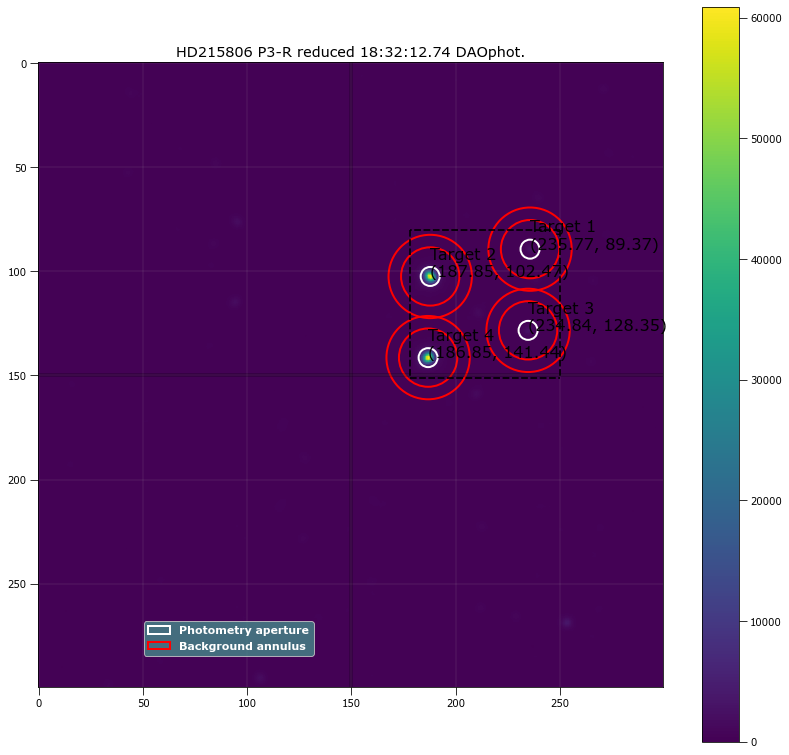

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 235.77285 89.366399 ...          858.63384      186782.22          754.60882
  2 187.85232 102.47471 ...          19348.201      201163.65          799.19285
  3 234.83526 128.34838 ...          863.75398      180048.07           713.0809
  4 186.84656 141.43627 ...          19350.935      198315.15          787.45142

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 235.77285 89.366399 ...                 781.73987             40074.262
  2 187.85232 102.47471 ...                 19266.764        

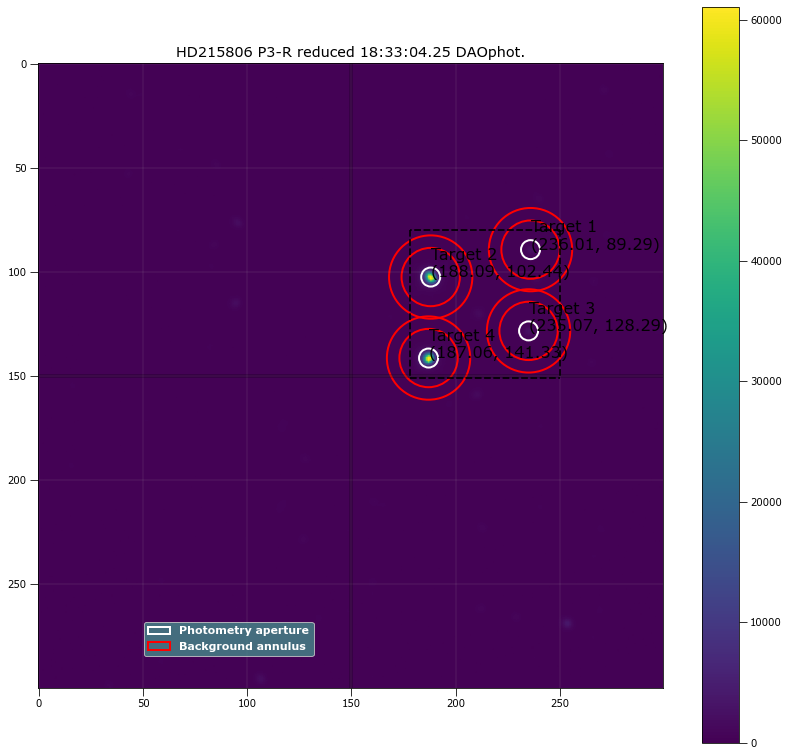

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 236.00741 89.287412 ...          874.56892      187184.95          757.50963
  2 188.09373 102.44472 ...          19856.066      199558.96          793.05933
  3 235.07092 128.29292 ...           883.4992      179727.95          711.73143
  4 187.06087 141.32665 ...          19879.001      196326.47          780.01316

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 236.00741 89.287412 ...                 797.37937             40535.788
  2 188.09373 102.44472 ...                 19775.254        

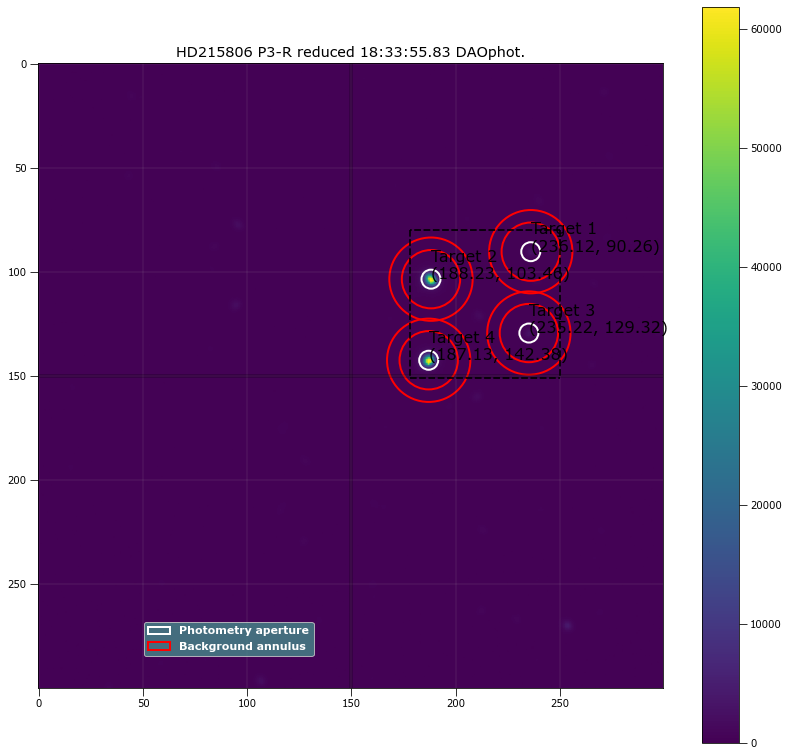

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 236.12412 90.264812 ...          892.44236      186000.78          754.06248
  2 188.23064 103.45953 ...          20087.346      198272.48          788.08567
  3 235.21546 129.31624 ...          895.15966      180286.19          713.85521
  4 187.12799  142.3825 ...          20236.979      195923.39          778.70919

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 236.12412 90.264812 ...                 815.60407             41299.967
  2 188.23064 103.45953 ...                 20007.041        

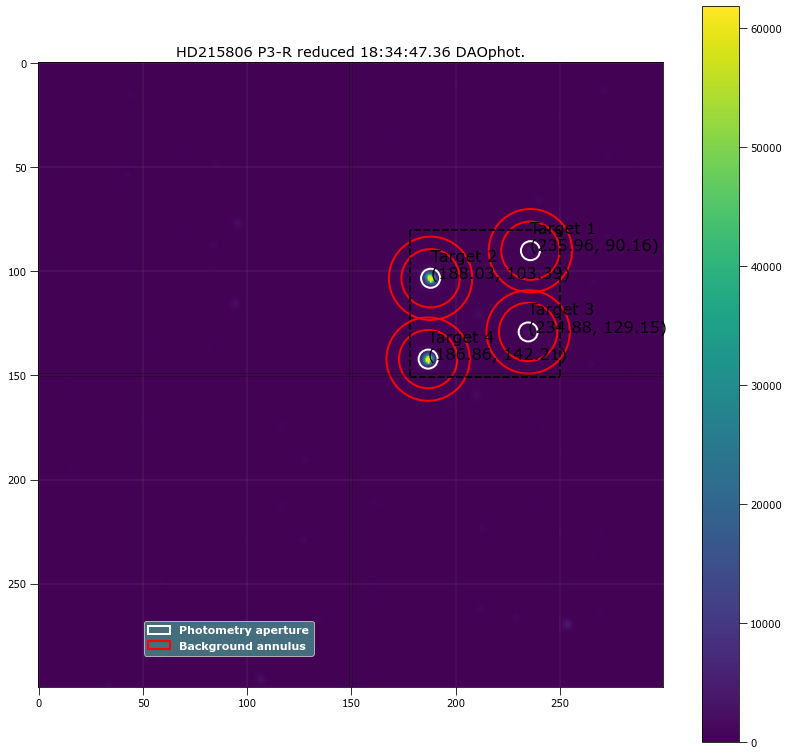

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 235.96084 90.155441 ...          934.92843      187109.52          759.60387
  2 188.03456 103.38956 ...          21258.495      199475.25          793.48429
  3 234.88314 129.15124 ...          933.63324      179765.62          711.96772
  4 186.85793 142.20532 ...          21201.824      196132.03           779.7131

 Aperture are: 65.30559781856107 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 235.96084 90.155441 ...                 857.52548             42203.924
  2 188.03456 103.38956 ...                 21177.639        

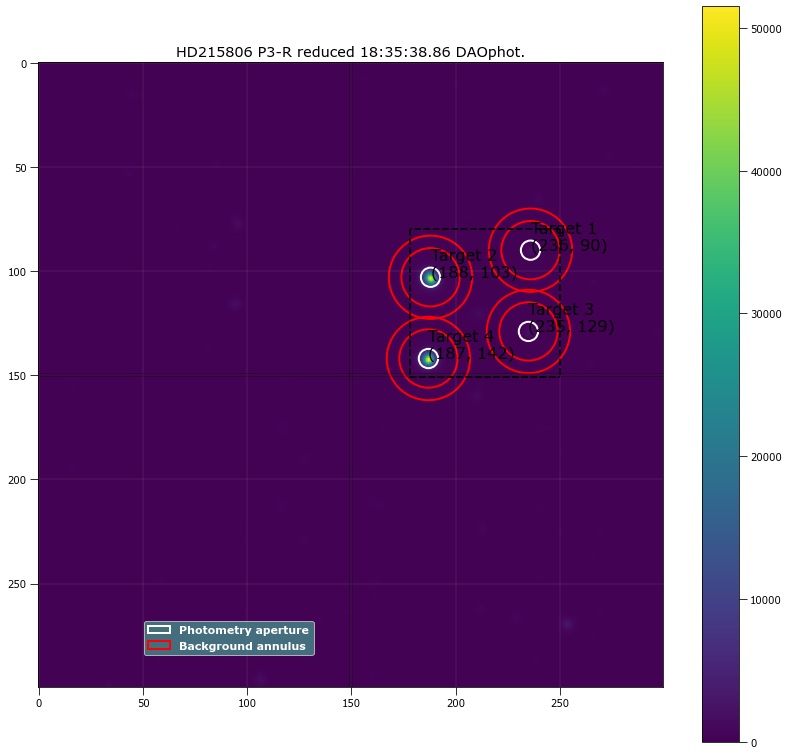

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     236      90 ...          788.26371      187581.64          754.66081
  2     188     103 ...          17081.125      202851.74          804.75537
  3     235     129 ...           791.6216      180537.46          715.09392
  4     187     142 ...          17124.878      200547.89          796.25792

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     236      90 ...                 709.06048             38133.954
  2     188     103 ...                 16996.664             1105364.7
  3     235     129 ...          

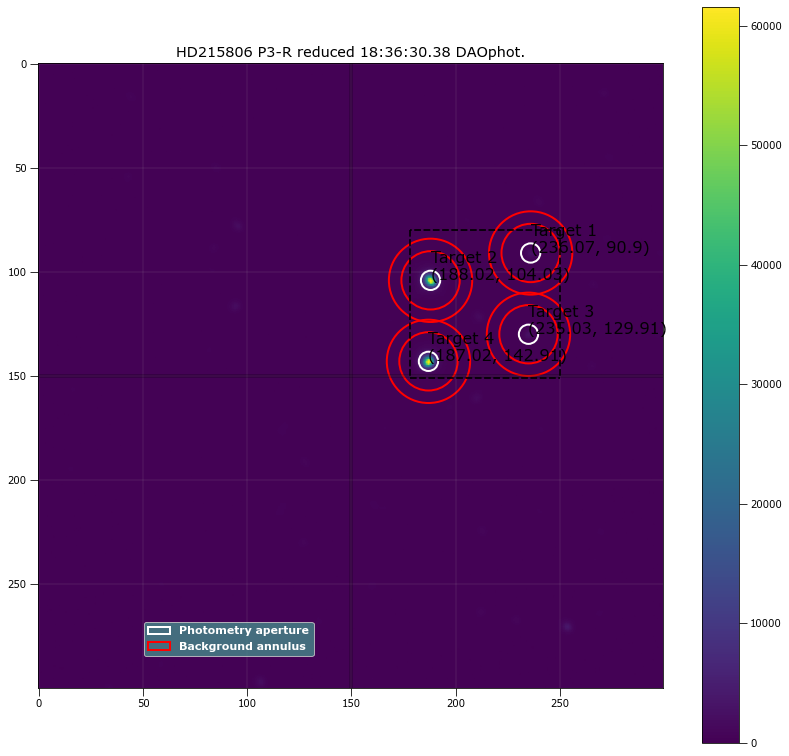

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 236.06939 90.895479 ...          865.30052      187156.62          754.93889
  2 188.01959 104.03079 ...          19198.461      200514.91          796.59088
  3 235.03049 129.90712 ...          873.63276      179381.13          710.30261
  4 187.01585 142.91154 ...          19154.733       197558.2          784.63121

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 236.06939 90.895479 ...                  786.0681             40011.456
  2 188.01959 104.03079 ...                 19114.857        

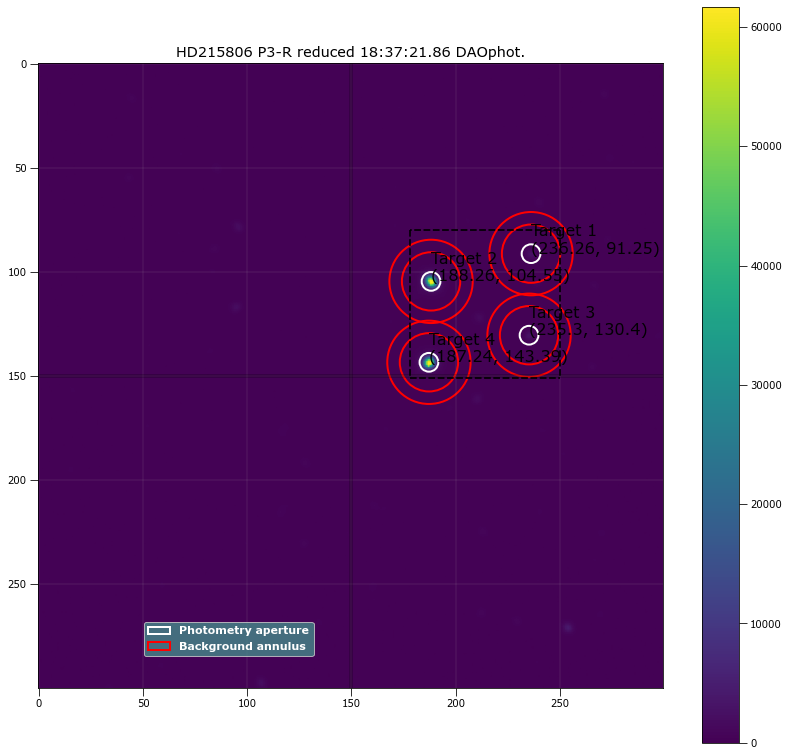

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 236.25993 91.247061 ...          902.69397      187540.87          760.83422
  2 188.26002 104.55155 ...          20245.767      199256.86          792.03732
  3 235.29577  130.3954 ...          912.22231      179969.96          712.57213
  4 187.24394 143.39139 ...           20308.83      197485.87          784.88162

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 236.25993 91.247061 ...                 827.45417             41208.841
  2 188.26002 104.55155 ...                 20167.441        

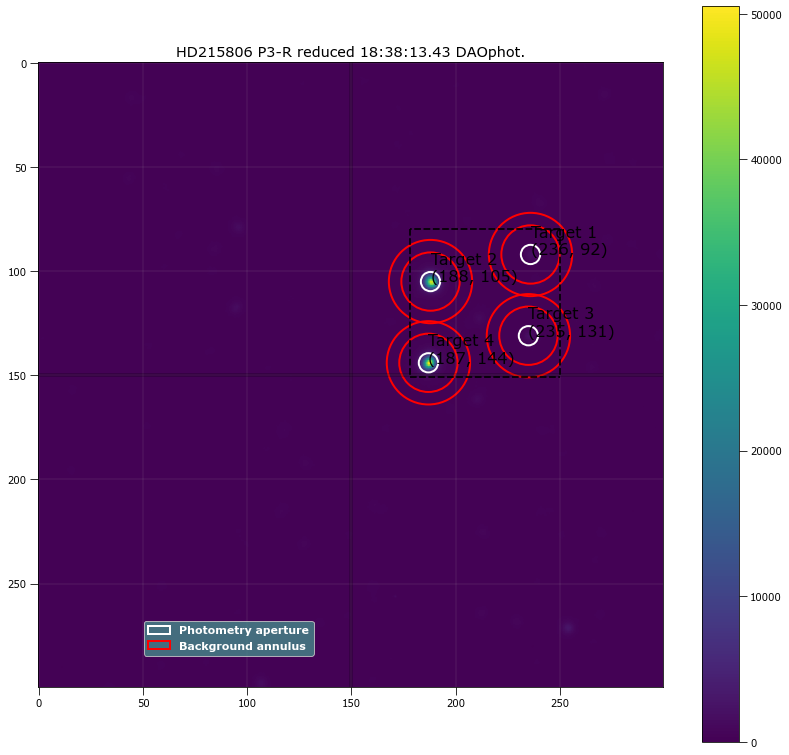

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     236      92 ...          774.07734      186935.51          751.01219
  2     188     105 ...          16689.106      201815.38          801.09253
  3     235     131 ...          784.67862      179856.65          712.12038
  4     187     144 ...          16857.327      200553.93          795.95719

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     236      92 ...                 695.25704             37410.768
  2     188     105 ...                 16605.029             1091925.6
  3     235     131 ...          

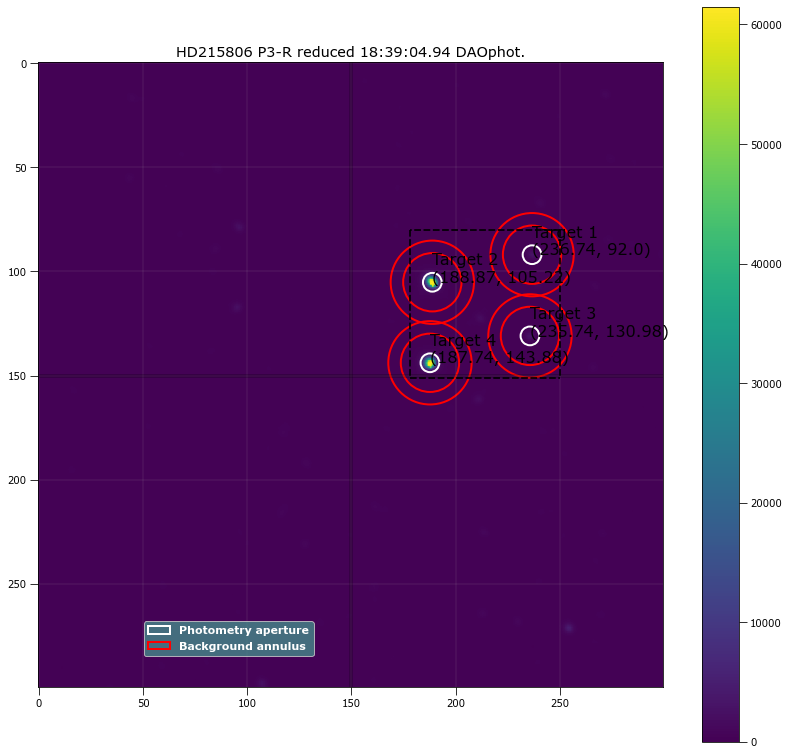

 id  xcenter   ycenter  ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
       pix       pix    ...                                                     
--- --------- --------- ... ------------------ -------------- ------------------
  1 236.74207 91.996592 ...          947.27167      186180.69          757.28981
  2 188.87027 105.22271 ...          21675.259      198712.49          790.59147
  3 235.73659 130.97764 ...          950.44867      179491.89          710.84263
  4 187.73514 143.88379 ...          21348.095       195569.9          777.75906

 Aperture are: 63.37786386048353 Annulus Area: 640.8849013323178 

 id  xcenter   ycenter  ... residual_aperture_sum_err residual_aperture_sum
       pix       pix    ...                                                
--- --------- --------- ... ------------------------- ---------------------
  1 236.74207 91.996592 ...                 872.38239             42224.076
  2 188.87027 105.22271 ...                 21597.076        

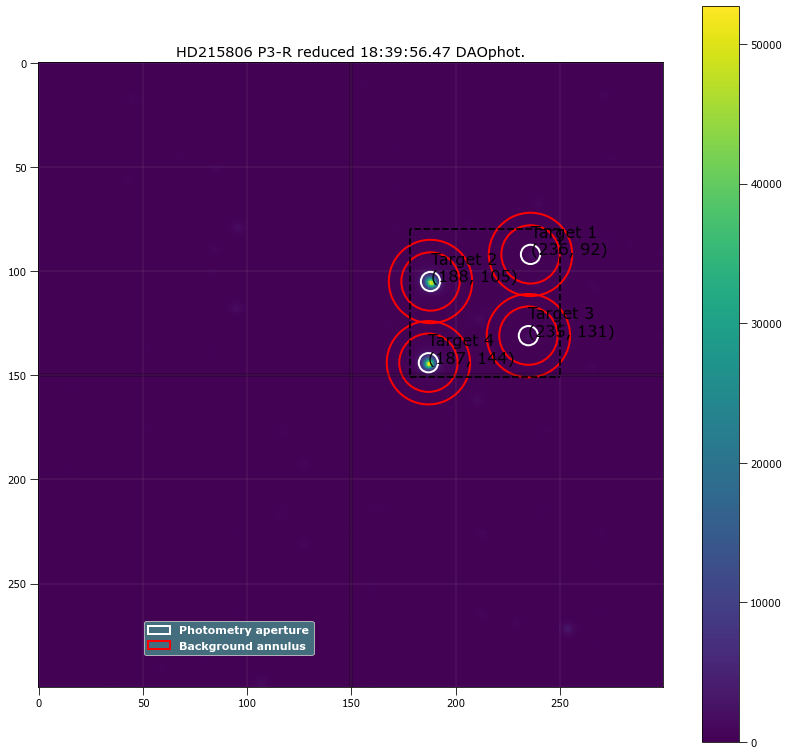

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     236      92 ...          784.28006      186757.35          751.96173
  2     188     105 ...          16951.666      203217.39          806.39085
  3     235     131 ...          781.30517       179416.6          710.60571
  4     187     144 ...          17020.658       200680.1          796.83458

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     236      92 ...                  705.3601             37478.858
  2     188     105 ...                 16867.034             1085934.2
  3     235     131 ...          

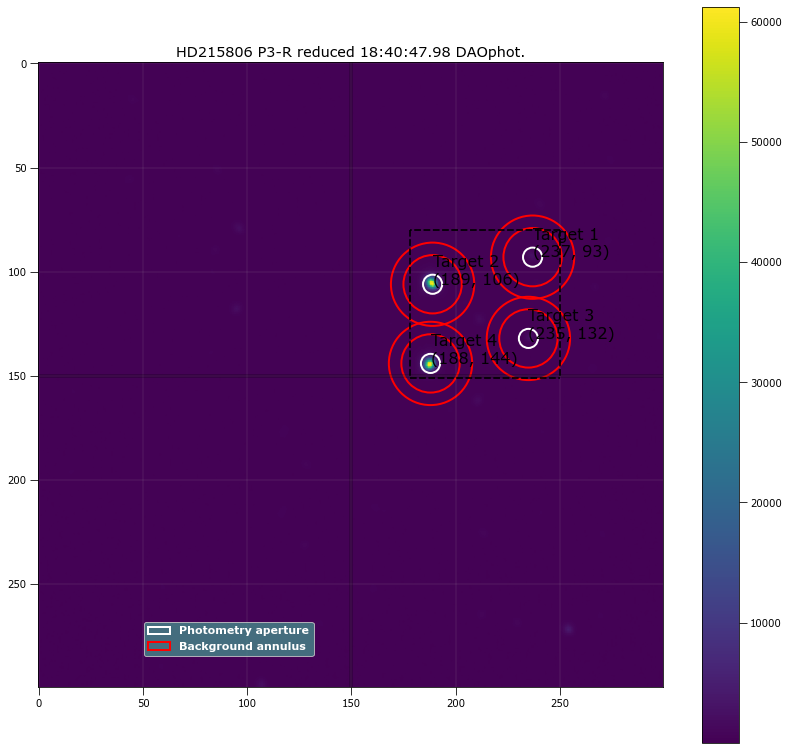

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     237      93 ...          870.30091      184494.58          742.10749
  2     189     106 ...          19538.973      200351.61          796.47174
  3     235     132 ...          877.54102      178364.07          706.29533
  4     188     144 ...          19569.071      197693.29          786.40775

 Aperture are: 66.28029476365643 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     237      93 ...                 793.55218             40188.716
  2     189     106 ...                 19456.602             1145679.7
  3     235     132 ...          

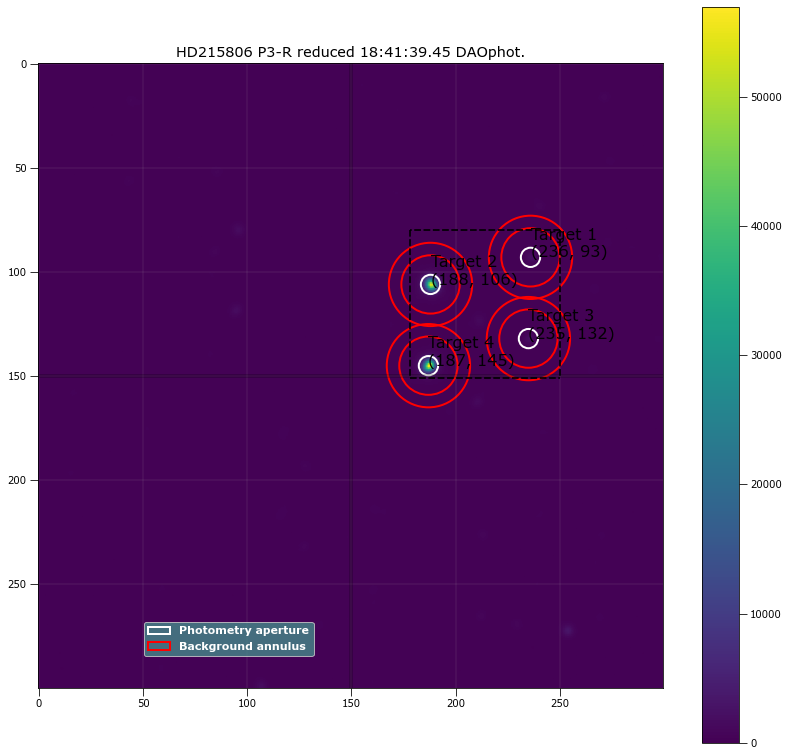

 id xcenter ycenter ... aperture_sum_err_0 aperture_sum_1 aperture_sum_err_1
      pix     pix   ...                                                     
--- ------- ------- ... ------------------ -------------- ------------------
  1     236      93 ...          817.50227      184718.39          744.25798
  2     188     106 ...           18026.01      199280.87           791.0616
  3     235     132 ...          830.24287      178848.43          708.26583
  4     187     145 ...          18281.288      196524.64          780.18063

 Aperture are: 67.26221168612287 Annulus Area: 640.8849013323178 

 id xcenter ycenter ... residual_aperture_sum_err residual_aperture_sum
      pix     pix   ...                                                
--- ------- ------- ... ------------------------- ---------------------
  1     236      93 ...                 739.39083             39622.851
  2     188     106 ...                 17942.987             1141013.6
  3     235     132 ...          

In [71]:
#The pipe!
#we expect 4 targets
#37 doesnt work
#Here is a work around. Incorporate the peak finder into the pipeline and tell the process such that if DAO cannot find the 
#targets, use the peak find coordinates. I suspect the problem is the FWHM.

#P3 - R Filter
print("P3-R Filter")

res_apt_sum_list = []

start = 75
end = 109
filename = astropy.io.fits.open(pol_std[start])[0].header['OBJECT']+"_"+astropy.io.fits.open(pol_std[start])[0].header['FILTER']

workbook = xlsxwriter.Workbook('./stats/'+MJD+"_"+ filename+str(start)+"-" +str(end)  +'.xlsx')
worksheet = workbook.add_worksheet()
worksheet.write('A1', 'int')
worksheet.write('B1', 'time obs')
worksheet.write('C1', 'filter')
worksheet.write('D1', 'exptime')
worksheet.write('E1', 'pol_std 1 x center')
worksheet.write('F1', 'pol_std 1 y center')
worksheet.write('G1', 'pol_std 1 counts')
worksheet.write('H1', 'pol_std 1 error')
worksheet.write('I1', 'pol_std 2 x center')
worksheet.write('J1', 'pol_std 2 y center')
worksheet.write('K1', 'pol_std 2 counts')
worksheet.write('L1', 'pol_std 2 error')
worksheet.write('M1', 'pol_std 3 x center')
worksheet.write('N1', 'pol_std 3 y center')
worksheet.write('O1', 'pol_std 3 counts')
worksheet.write('P1', 'pol_std 3 error')
worksheet.write('Q1', 'pol_std 4 x center')
worksheet.write('R1', 'pol_std 4 y center')
worksheet.write('S1', 'pol_std 4 counts')
worksheet.write('T1', 'pol_std 4 error')
worksheet.write('U1', 'q')
worksheet.write('V1', 'q error')
worksheet.write('W1', 'u')
worksheet.write('X1', 'u error')
worksheet.write('Y1', 'PD')
worksheet.write('Z1', 'PD error')
worksheet.write('AA1', 'PA')
worksheet.write('AB1', 'PA error')

row = 1
column = 0
search_off = 150
siegma_search = 3
search_bracket = [70, 1, -28, 100]

for k in range(start, end ):
    reduced_obj = funcs_calib_and_plot.plot_double_raw_v_reduced(astropy.io.fits.open(pol_std[k]),
                                        [512, 512, 512, 512], 
                                        (m_biast, m_dark, m_flat), 
                                        False, True, False)

    trial_radii = np.linspace(3.0, 7, num=60)
    pol_std_a = []
    pol_std_b = []
    pol_std_c = []
    pol_std_d = []
    for radii in trial_radii:
        #Find the position
        DAO_positions = funcs_star_finder.dao_star_finder(reduced_obj, search_bracket, siegma_search, 
                                                          2000, search_off, radii, 14 , 20, False, False)
        
        if (len(DAO_positions) != 4):
            x_targ, y_targ, peak_targ  = funcs_polarimetry.source_peak_finder_pol_std(reduced_obj, 2, search_bracket, 500, False, False) #what do I return from this?
            apt_pos = funcs_star_finder.plot_spotted(reduced_obj, search_off, search_bracket , x_targ, y_targ, peak_targ, False, False)
            DAO_positions = funcs_star_finder.peak_to_DAO(apt_pos)        
        
        #Insert Trial
        phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions, radii, 14 , 20, False, False)
        pol_std_a.append(phot_tab['residual_aperture_sum'][0])
        pol_std_b.append(phot_tab['residual_aperture_sum'][1])
        pol_std_c.append(phot_tab['residual_aperture_sum'][2])
        pol_std_d.append(phot_tab['residual_aperture_sum'][3])

    combine_pol_std = [pol_std_a, pol_std_b, pol_std_c, pol_std_d]
    
    #solve for good radii
    good_radii=funcs_apt_phot.solve_apt(combine_pol_std, trial_radii, False)

    print("Aperture radius for", reduced_obj[0].header['TIME-OBS'],"is", good_radii)
    phot_tab = funcs_apt_phot.apt_phot_local_bkg_sub(reduced_obj, search_off, search_bracket, DAO_positions,good_radii, 14 , 20, True, False)

    res_apt_sum_list.append(phot_tab['residual_aperture_sum'])
    #propagate the position forward
    
    print("\nWrite this out the excel")
    print(k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3], "\n")
    
    write_this = [k, 
          astropy.io.fits.open(pol_std[k])[0].header['TIME-OBS'],
          astropy.io.fits.open(pol_std[k])[0].header['FILTER'],
          astropy.io.fits.open(pol_std[k])[0].header['EXPTIME'],
          phot_tab['xcenter'][0].value, phot_tab['ycenter'][0].value,
          phot_tab['residual_aperture_sum'][0], phot_tab['residual_aperture_sum_err'][0],
          phot_tab['xcenter'][1].value, phot_tab['ycenter'][1].value,
          phot_tab['residual_aperture_sum'][1], phot_tab['residual_aperture_sum_err'][1],
          phot_tab['xcenter'][2].value, phot_tab['ycenter'][2].value,
          phot_tab['residual_aperture_sum'][2], phot_tab['residual_aperture_sum_err'][2],
          phot_tab['xcenter'][3].value, phot_tab['ycenter'][3].value,
          phot_tab['residual_aperture_sum'][3], phot_tab['residual_aperture_sum_err'][3]   ]

    for item in write_this :
        worksheet.write(row, column, item)
        column += 1
        
    column = 0
    row += 1
    
workbook.close()

pol_std_1 = []
pol_std_2 = []
pol_std_3 = []
pol_std_4 = []

for things in res_apt_sum_list:
    pol_std_1.append(things[0])
    pol_std_2.append(things[1])
    pol_std_3.append(things[2])
    pol_std_4.append(things[3])

In [ ]:
#Now I am seeing a case where with the threshold lowered, long compute time I am picking up unwanted background sources

In [ ]:
#I'm looking at the example from P1-R
#Target_1

In [ ]:
#1 and 2 are posed to be the ordinary ray. One and 2 are post to be the brightest always.